### Table of Contents

* [Chapter 1](#chapter1)
* [Imports and functions](#chapter2)
* [Without Extinction](#chapter2)
    * [Load Data](#section_3_1)
    * [Learning Reward Figures](#section_3_2)
        * [p=0.6](#section_3_2_1)


## Run first

### Imports and functions  <a class="anchor" id="chapter1"></a>


In [2]:
# Run first
import pickle
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import chart_studio.plotly as py
import plotly.express as px
import pandas as pd
import cufflinks as cf
import json as js
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import itertools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)
import plotly.io as pio
pio.renderers.default = 'notebook_connected'
import os
import action_selection as asl
from itertools import product, repeat
import jsonpickle as pickle
import jsonpickle.ext.numpy as jsonpickle_numpy
import json

import perception as prc
import agent as agt
from environment import PlanetWorld
from agent import BayesianPlanner
from world import World
from planet_sequences import generate_trials_df
from multiprocessing import Pool
import time


# functions
def load_file_names(arrays, extinguish = True):
    lst = []
    for i in product(*arrays):
        lst.append(list(i))
    
    names = []
    print('files to load: ' + str(len(lst)))
    for li, l in enumerate(lst):
        prefix = ''
        if l[0] == True:
            prefix += 'switch1_'
        else:
            prefix +='switch0_'

        if l[1] == True:
            prefix += 'degr1_'
        else:
            prefix += 'degr0_'

        fname = prefix + 'p' + str(l[4])  +'_learn_rew' + str(int(l[2] == True))+ '_q' + str(l[3]) + '_h' + str(l[5]) + '_' +\
        str(l[8]) + '_' + str(l[6]) + str(l[7])

        if extinguish:
            fname +=  '_extinguish.json'
        else:
            fname += '_learned_during_extinction.json'
        names.append(fname)

    return names

def load_df(names,data_folder='data', extinguish=None):

    if extinguish is None:
        raise('did not specify if rewarded during extinction')
    # if not just_simulated:
    path = os.path.join(os.getcwd(),data_folder)
    #     names = os.listdir(path)

    for fi, f in enumerate(names):
        names[fi] = os.path.join(path,f)

    dfs = [None]*len(names)

    for f,fname in enumerate(names):
        jsonpickle_numpy.register_handlers()
        with open(fname, 'r') as infile:
            data = json.load(infile)
        worlds = pickle.decode(data)
        meta = worlds[-1]
        agents = [w.agent for w in worlds[:-1]]
        perception = [w.agent.perception for w in worlds[:-1]]
        nt = worlds[0].T
        npl = perception[0].npl
        nr = worlds[0].agent.nr
        nc = perception[0].nc
        nw = len(worlds[:-1])
        ntrials = meta['trials']
        learn_rew = np.repeat(meta['learn_rew'], ntrials*nw*nt)
        switch_cues = np.repeat(meta['switch_cues'], ntrials*nw*nt)
        contingency_degradation = np.repeat(meta['contingency_degradation'], ntrials*nw*nt)
        ntrials_df = np.repeat(meta['trials_per_block'], ntrials*nw*nt)
        ndb = np.repeat(meta['degradation_blocks'], ntrials*nw*nt)
        ntb = np.repeat(meta['training_blocks'], ntrials*nw*nt)
        post_dir_rewards = [a.posterior_dirichlet_rew for a in agents]
        post_dir_rewards = [post[:,1:,:,:] for post in post_dir_rewards]
        entropy_rewards = np.zeros([nw*ntrials*nt,nc])
        extinguished = np.zeros(ntrials*nw*nt, dtype='int32')
        extinguished[:] = int(extinguish == True)
        
        for ip, post in enumerate(post_dir_rewards):
            post = post.sum(axis=3)
            norm = post.sum(axis=2)
            reward_distributions = np.zeros(post.shape)

            for r in range(nr):
                reward_distributions[:,:,r,:] = np.divide(post[:,:,r,:],norm)
            entropy = np.zeros([ntrials, nt, nc])

            for trl in range(ntrials):
                for t in range(nt-1):
                    prob = reward_distributions[trl,t,:,:].T
                    # if prob.sum() == 0:
                    #     print('problem')
                    entropy[trl,t+1,:] = -(np.log(prob)*prob).sum(axis=1)

            entropy[:,0,:] = None
            entropy_rewards[ip*(ntrials*nt):(ip+1)*(ntrials*nt),:] = np.reshape(entropy, [ntrials*nt,nc])

        entropy_context = np.zeros(ntrials*nt*nw)
        post_context = [a.posterior_context for a in agents]

        for ip, post in enumerate(post_context):
            entropy = np.zeros([ntrials, nt])

            for trl in range(ntrials):
                entropy[trl,:] = -(np.log(post[trl,:])*post[trl,:]).sum(axis=1) 
            entropy_context[ip*(ntrials*nt):(ip+1)*(ntrials*nt)] = np.reshape(entropy, [ntrials*nt])

        posterior_context = [agent.posterior_context for agent in agents]
        observations = [w.observations for w in worlds[:-1]]
        context_cues = worlds[0].environment.context_cues
        policies = worlds[0].agent.policies
        actions = [w.actions[:,:3] for w in worlds[:-1]] 
        true_optimal = np.tile(np.repeat(meta['optimal_sequence'],nt), nw)
        cue = np.tile(np.repeat(context_cues, nt), nw)
        ex_p = np.zeros(ntrials)
        executed_policy = np.zeros(nw*ntrials,dtype='int32')
        optimality = np.zeros(nw*ntrials)
        chose_optimal = np.zeros(nw*ntrials)

        for w in range(nw):
            for pi, p in enumerate(policies):
                inds = np.where( (actions[w][:,0] == p[0]) & (actions[w][:,1] == p[1]) & (actions[w][:,2] == p[2]) )[0]
                ex_p[inds] = pi
            executed_policy[w*ntrials:(w+1)*ntrials] = ex_p
            ch_op = executed_policy[w*ntrials:(w+1)*ntrials] == meta['optimal_sequence']
            chose_optimal[w*ntrials:(w+1)*ntrials] = ch_op
            optimality[w*ntrials:(w+1)*ntrials] = np.cumsum(ch_op)/(np.arange(ntrials)+1)

        executed_policy = np.repeat(executed_policy, nt)
        chose_optimal = np.repeat(chose_optimal, nt)
        optimality = np.repeat(optimality, nt)
        no = perception[0].generative_model_context.shape[0]
        optimal_contexts = [np.argmax(perception[0].generative_model_contexts[i,:] for i in range(no))]
        true_context = 0
        q = np.repeat(meta['context_trans_prob'], ntrials*nw*nt)
        p = np.repeat(meta['cue_ambiguity'], ntrials*nw*nt)
        h = np.repeat(meta['h'], ntrials*nw*nt)
        switch_cues = np.repeat(meta['switch_cues'], ntrials*nw*nt)
        learn_rew = np.repeat(meta['learn_rew'], ntrials*nw*nt)
        degradation = np.repeat('contingency_degradation', ntrials*nw*nt)
        trial_type = np.tile(np.repeat(meta['trial_type'], nt), nw)
        trial = np.tile(np.repeat(np.arange(ntrials),nt), nw)
        run = np.repeat(np.arange(nw),nt*ntrials)
        run.astype('str')
        inferred_context_t0 = np.zeros(ntrials*nw,dtype='int32')
        inferred_context_t3  = np.zeros(ntrials*nw,'int32')
        agnt = np.repeat(np.arange(nw)+f*nw,nt*ntrials)
        no, nc = perception[0].generative_model_context.shape 
        modes_gmc =  perception[0].generative_model_context.argsort(axis=1)
        contexts = [modes_gmc[i,:][-2:] for i in range(no)] # arranged in ascending order!
        if_inferred_context_switch = np.zeros(ntrials, dtype="int32")

        for i in range(no):    
            c = np.array([contexts[i][-1]]*(meta['trials_per_block']*meta['training_blocks'])\
                + [contexts[i][-2]]*(meta['trials_per_block']*meta['degradation_blocks'])\
                + [contexts[i][-1]]*meta['trials_per_block'])
            if_inferred_context_switch[np.where(context_cues == i)] = c[np.where(context_cues == i)]
        inferred_switch = np.zeros(ntrials*nw,dtype='int32')
        context_optimality = np.zeros(ntrials*nw)

        for w in range(nw):
            inferred_context_t0[w*ntrials:(w+1)*ntrials] = np.argmax(posterior_context[w][:,0,:],axis=1)
            inferred_context_t3[w*ntrials:(w+1)*ntrials] = np.argmax(posterior_context[w][:,-1,:],axis=1)
            inferred_switch[w*ntrials:(w+1)*ntrials] = if_inferred_context_switch == \
                                                    inferred_context_t3[w*ntrials:(w+1)*ntrials]
            context_optimality[w*ntrials:(w+1)*ntrials] = np.cumsum(inferred_switch[w*ntrials:(w+1)*ntrials])\
                                                                /(np.arange(ntrials)+1)
    
        inferred_switch = np.repeat(inferred_switch, nt)
        inferred_context_t0 = np.repeat(inferred_context_t0, nt)
        inferred_context_t3 = np.repeat(inferred_context_t3, nt)
        context_optimality = np.repeat(context_optimality, nt)
        t = np.tile(np.arange(4), nw*ntrials)
        
        d = {'trial_type':trial_type, 'run':run, 'trial':trial, 't':t, 'true_optimal':true_optimal,\
                            'cue':cue, 'q':q, 'p':p, 'h':h, 'inferred_context_t0':inferred_context_t0,\
                            'inferred_context_t3':inferred_context_t3, 'executed_policy':executed_policy,\
                            'chose_optimal': chose_optimal, 'entropy_rew_c1': entropy_rewards[:,0], 'entropy_rew_c2': entropy_rewards[:,1], \
                            'entropy_rew_c3': entropy_rewards[:,2] , 'entropy_rew_c4': entropy_rewards[:,3],\
                            'policy_optimality':optimality,'agent':agnt, 'inferred_switch': inferred_switch,\
                            'context_optimality':context_optimality, 'learn_rew': learn_rew, 'entropy_context':entropy_context, \
                            'switch_cues':switch_cues, 'contingency_degradation': contingency_degradation,\
                            'degradation_blocks': ndb, 'training_blocks':ntb, 'trials_per_block': ntrials_df, 'extinguished':extinguished} 

        # for key in d.keys():
        #     print(key, np.unique(d[key].shape))
        dfs[f] = pd.DataFrame(d)
    data = pd.concat(dfs)
    data.astype({'h': 'category'})

    return data

def context_plots(query='p == 0.6', plot_context_entropy = True, plot_reward_entopy = True):

    # context and policy optimality
    fig = plt.figure(figsize=(10,3))
    plt.subplot(1,2,1)
    plot_df = base_df.query(query + '& t ==' + str(t) + ' & cue == ' + str(cue))
    plot_df['h'] = plot_df['h'].astype('category')
    ax = sns.lineplot(data=plot_df, x='trial', y='context_optimality', hue='h',\
                      palette=sns.color_palette('Reds_r',n_colors=np.unique(plot_df['h']).size), legend=False)
    ax.set(ylim = (0,1.1))
    ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
    cols = [[1,1,1], [0,0,0],[1,1,1]] 
    for i, row in ranges.iterrows():
        ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    # reward distribution entropy for different contexts
    plt.subplot(1,2,2)
    ax = sns.lineplot(data=plot_df, x='trial', y='policy_optimality', hue='h',\
            palette=sns.color_palette('Reds_r',n_colors=np.unique(plot_df['h']).size))
    ax.legend(ncol = np.unique(plot_df['h']).size, bbox_to_anchor=(-2, -0.25), loc='upper left',\
              borderaxespad=0,title='h')
    cols = [[1,1,1], [0,0,0],[1,1,1]] 
    for i, row in ranges.iterrows():
        ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    ax.set(ylim = (0,1))
    # title = base_query + ' & ' + query
    # title = title.replace(' & ', ', ')
    # title = title.replace('==', ':')
    title = 'Inferred context and policy optimality for p: ' + query[-3:] + ', switch cues: '\
            + str(int(switch)) + ', degradation: ' + str(int(contingency_degr)) + \
            ', reward_naive: ' + str(int(reward_naive)) + ', cue_shown: ' + str(cue)
    fig.suptitle(title, fontsize=15)

    # entropy of reward distribution for each context 
    if plot_reward_entopy:
        fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(11, 7))
        axs_flat = axs.flatten()
        legs = [False, False, False, True]
        ys = ['entropy_rew_c1', 'entropy_rew_c2','entropy_rew_c3','entropy_rew_c4',]
        for c in range(nc):
            sns.lineplot(ax=axs_flat[c], data=plot_df, x='trial',y=ys[c],hue='h',\
                palette=sns.color_palette('Reds_r',n_colors=np.unique(plot_df['h']).size), legend=legs[c])
            cols = [[1,1,1], [0,0,0],[1,1,1]]
            for i, row in ranges.iterrows():
                axs_flat[c].axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)
            axs_flat[-1].legend(ncol = np.unique(plot_df['h']).size, bbox_to_anchor=(-2, -0.25), loc='upper left',\
                                borderaxespad=0.5,title='h')
        
        title = 'Reward distribution entropy for  p: ' + query[-3:] + ', switch cues: ' + str(int(switch)) +\
                ', degradation: ' + str(int(contingency_degr)) + ', reward_naive: ' + str(int(reward_naive)) + \
                ', cue_shown: ' + str(cue)
        fig.suptitle(title, fontsize=15)

    # entropy of posterior over contexts
    if plot_context_entropy:
        fig,axes = plt.subplots(nrows=3, ncols=6,figsize = (27,15))
        hs = np.unique(plot_df['h'])
        for ai, ax in enumerate(axes.flatten()[:-1]):
            plot_df = base_df.query(query + '& t ==' + str(t) + ' & cue == ' + str(cue) + ' & h==' + str(hs[ai]))
            sns.lineplot(ax=ax, data=plot_df, x='trial', y='entropy_context', legend=False)
            cols = [[1,1,1], [0,0,0],[1,1,1]] 
            for i, row in ranges.iterrows():
                ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)
            ax.set_title('h = ' + str(hs[ai]))
            ax.set(xlabel=None)
            ax.set(ylim=[0,0.85])
        ax.legend(ncol = np.unique(plot_df['h']).size, bbox_to_anchor=(-1, -0.25), loc='upper left',\
                 borderaxespad=0,title='h')
        title = 'Entropy of posterior over context for  p: ' + query[-3:] + ', switch cues: ' +\
                 str(int(switch)) + ', degradation: ' + str(int(contingency_degr)) +\
                 ', reward_naive: ' + str(int(reward_naive)) + ', cue_shown: ' + str(cue)
        fig.suptitle(title, fontsize=15)


## Training = 4, Degradation = 2

### Without extinction  <a class="anchor" id="chapter2"></a>



#### Load Data  <a class="anchor" id="section_3_1"></a>

In [93]:
nc = 4
extinguish = False
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)


files to load: 1224


#### Learning Reward Figures  <a class="anchor" id="section_3_2"></a>

Context Exploration plots




Looks like an increse in certainty ob observation meaning makes the traces for different habitual tendnencies collapse into each other for ambiguos context transition beliefs (q=1/nc). This tendency is visible for q = 1/nc - 0.1 but appears at a higher p. 

##### p=0.6  <a class="anchor" id="section_3_2_1"></a>

extinction: [0]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


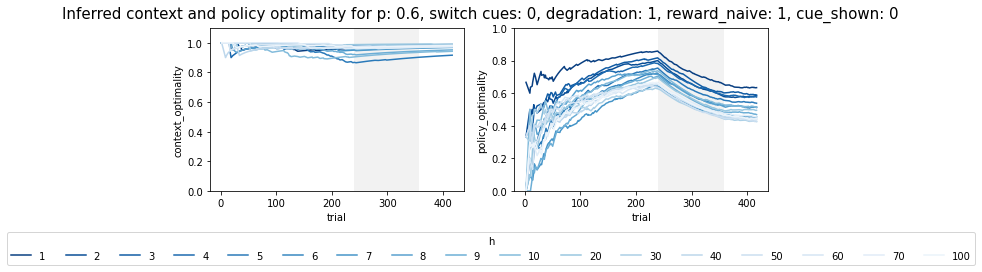

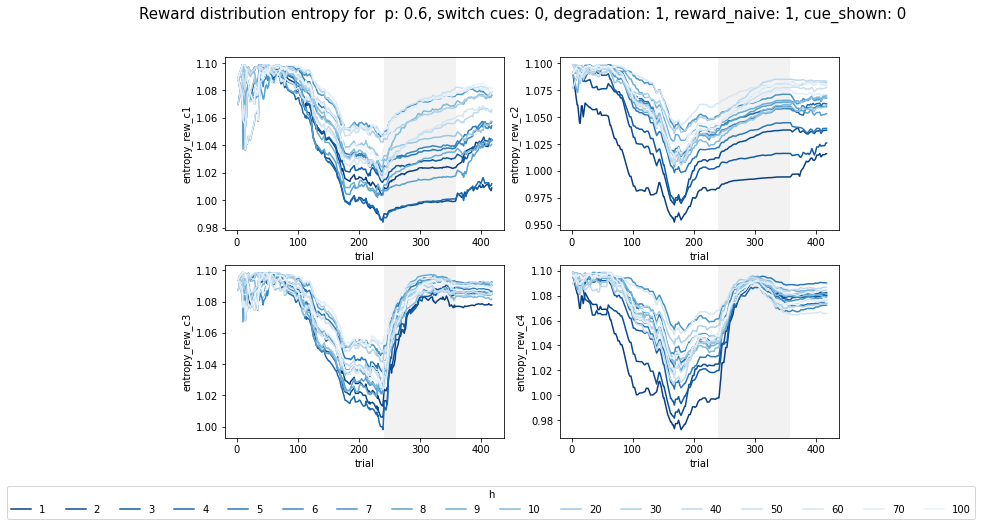

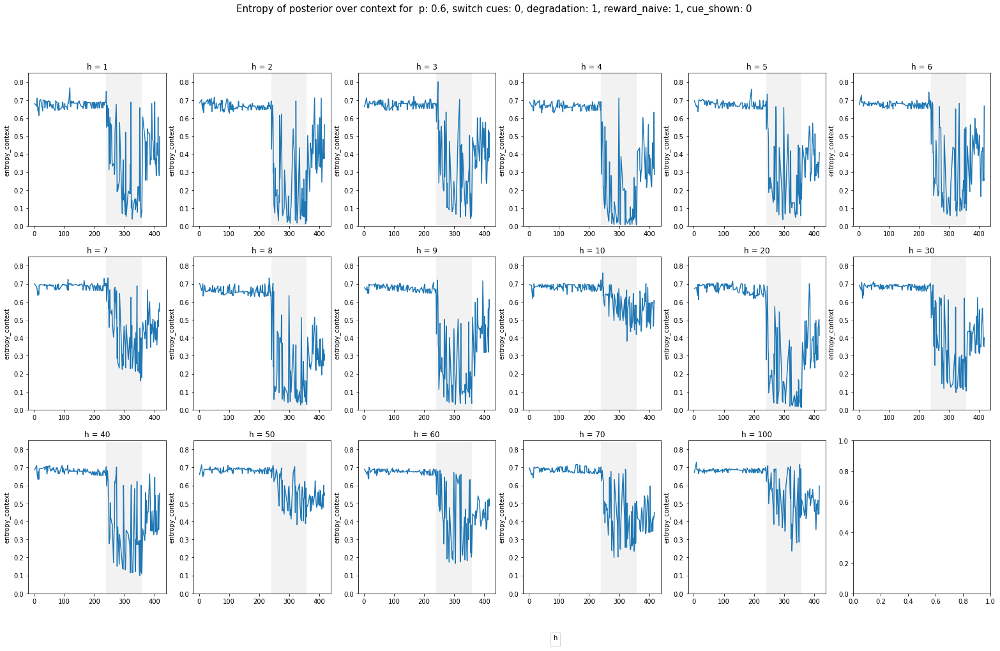

In [94]:
# context plot

# base query parameters
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
queries = ['p==0.6','p==0.7']
print('extinction:', np.unique(base_df['extinguished']))
context_plots(queries[0])   


##### p=0.8  <a class="anchor" id="section_3_2_2"></a>

For p=0.6, agents with h>= 30 fail at inferring a context change which indicates contingency degradation (contingency degradation trials are shown in gray). This can be seen in figure 1, left panel. More habitual agents can infer a context change. 

This can also be seen in the entropy over the reward distributions and the posterior over contexts I think? For h<30 agents we have a decrease in entropy for all reward distributions, independent of context, because the posterior over contexts is still relativelly undefined. However, once the contingency degradation trials start the habitual agents infer a context change and correspondingly the reward distribution for context 3 and 4 starts to grow again because of the increased uncertainty in reward contingencies, whilst the entropy stays relatively unchanged due to the inferred context change.

For less habitual agents the reward distribution changes in a similar manner for all contexts due to the comparatively flat posterior over contexts, compared to the habitual agents. Since there are no peaks in the posterior reward contingencies are updates similarly across all contexts. 

In this graph the case of contingency degradation without cue switching was explored. Degradation trials were as many as normal trials. In graph A inferred context and policy choice is plotted. Conclusions: less habitual agents struggle to infer a context change? Need to explore if this is till the case when there is more/less context uncertainty. 

In the lower graph I have plotted the entropy over reward distribution given context with the planet variable integrated out (p(r|p,c)). As expected

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


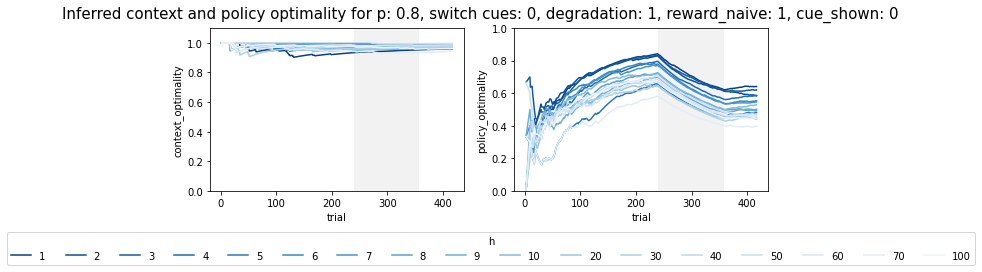

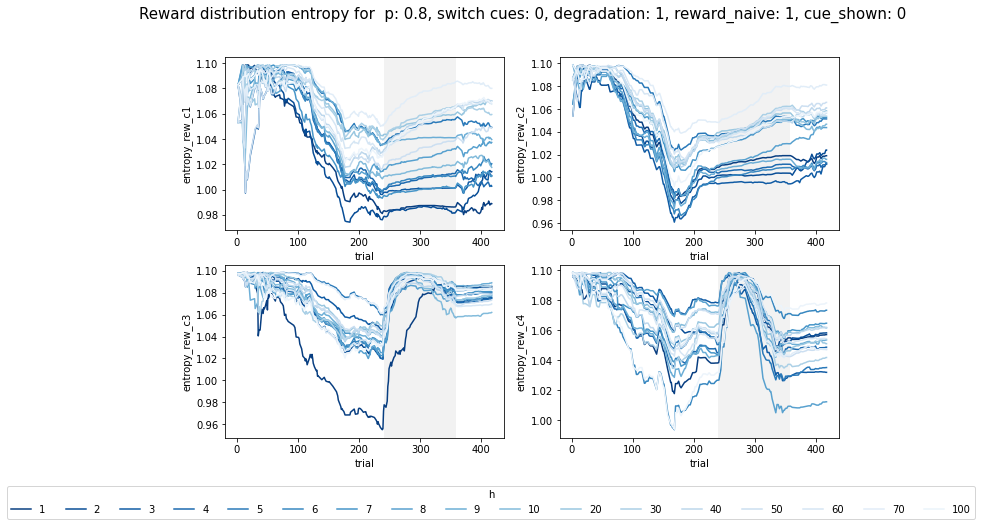

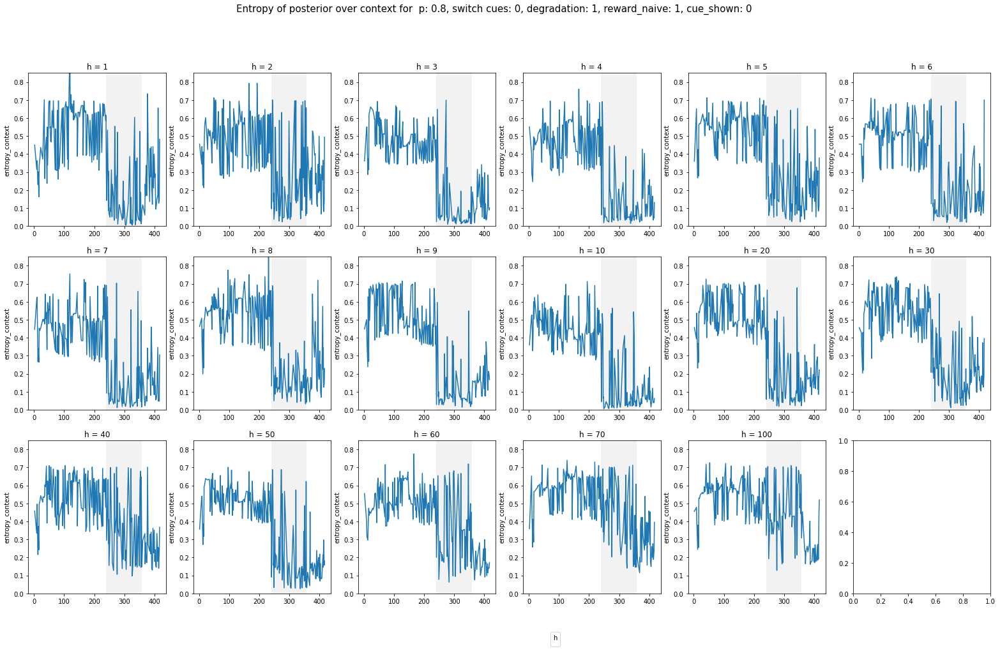

In [95]:
switch = False
contingency_degr = True
learn_r = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

context_plots('p == 0.8')

#### Reward Known figures <a class="anchor" id="section_3_3"></a>

##### p=0.6 <a class="anchor" id="section_3_3_1"></a>

extinction: [0]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


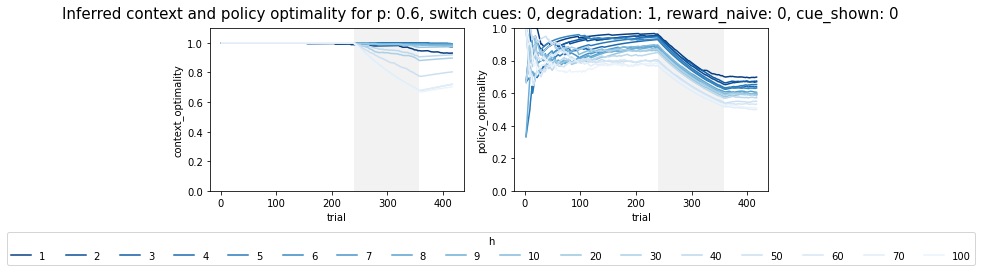

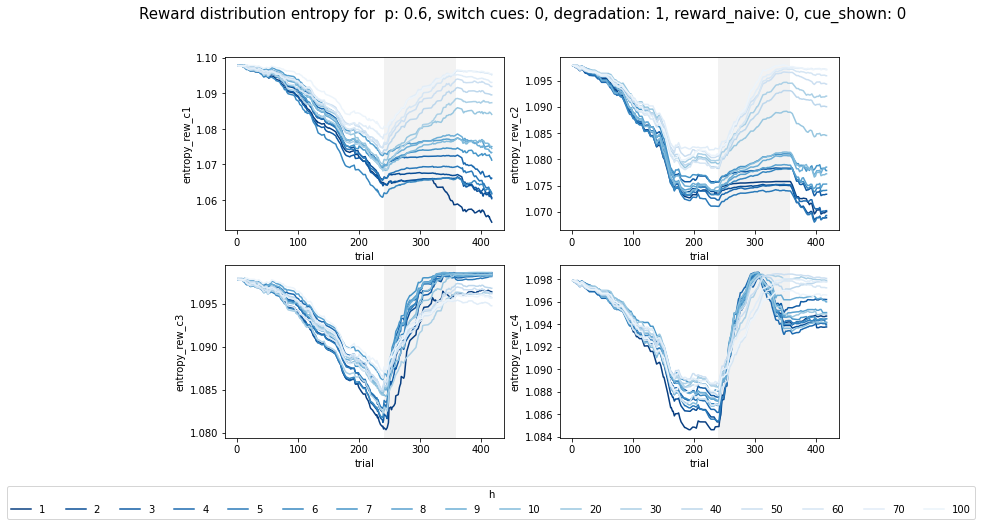

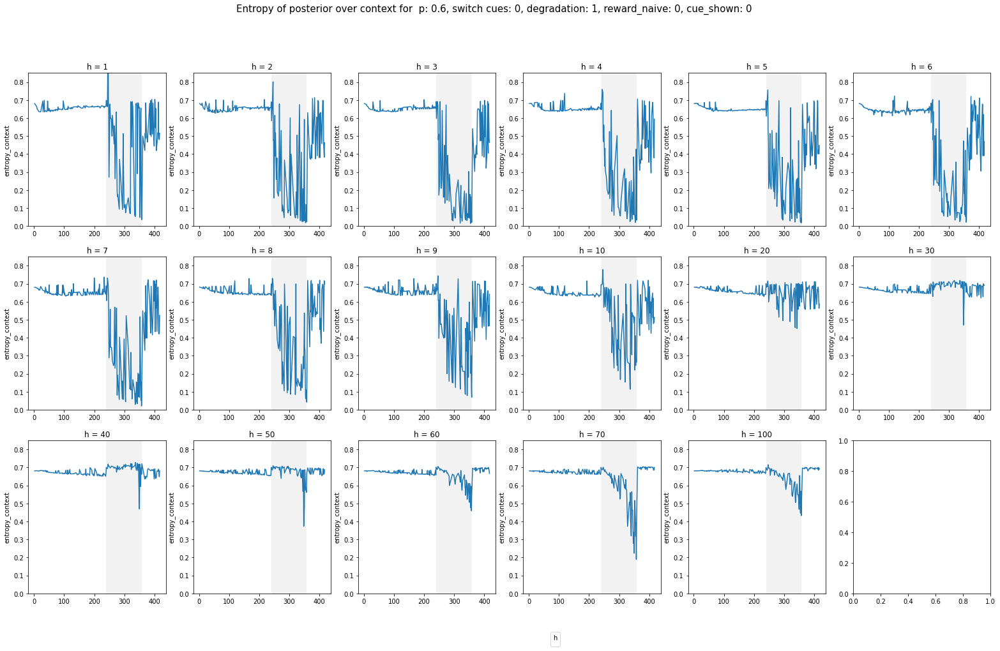

In [96]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.6')

##### p=0.8  <a class="anchor" id="section_3_3_3"></a>

extinction: [0]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


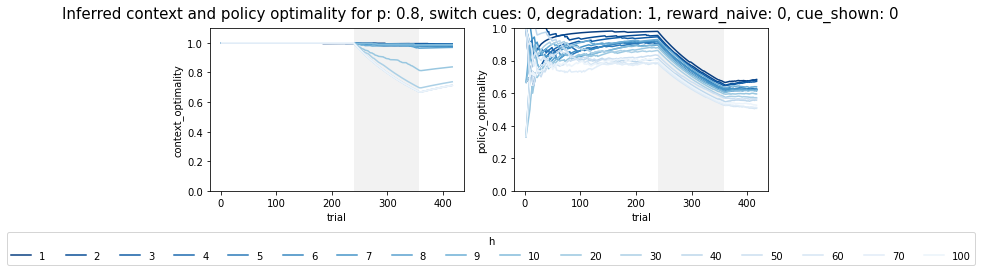

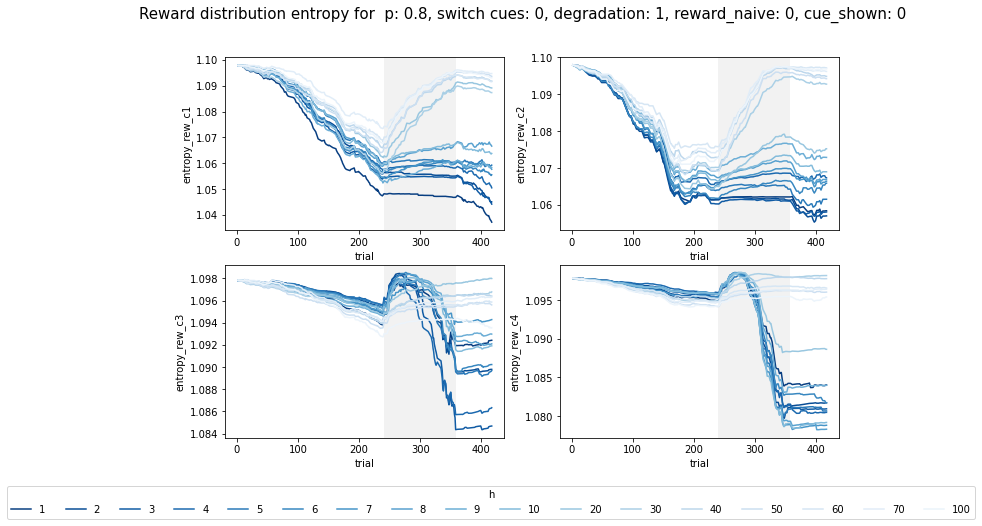

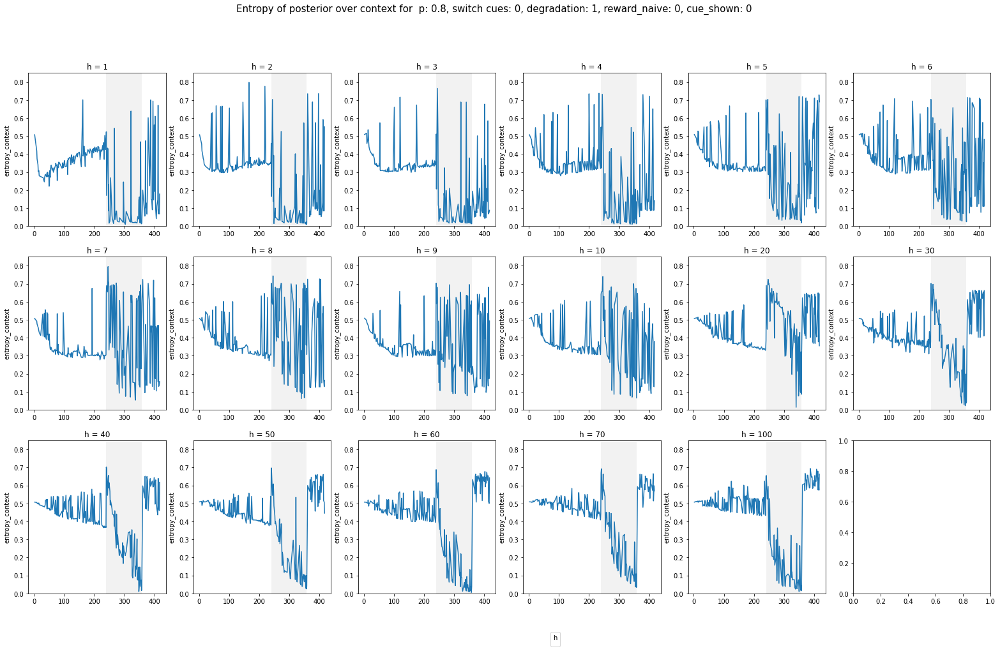

In [97]:
switch = False
contingency_degr = True
learn_r = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8')

Highly habitual agents do manage to infer a context change when they are reward naive, meaning that the initial reward counts are 1 for all rewards and all contexts. The agent above started with the correct probabilities multiplied by a 100 as initial counts which is probably too high. I should try with a midway regime of starting with the initial probabilities multipied by 2 or 5 or something so the agent is still flexible but has an idea of rewards.

#### Policy Optimality in detail compared b/n two cases

709920


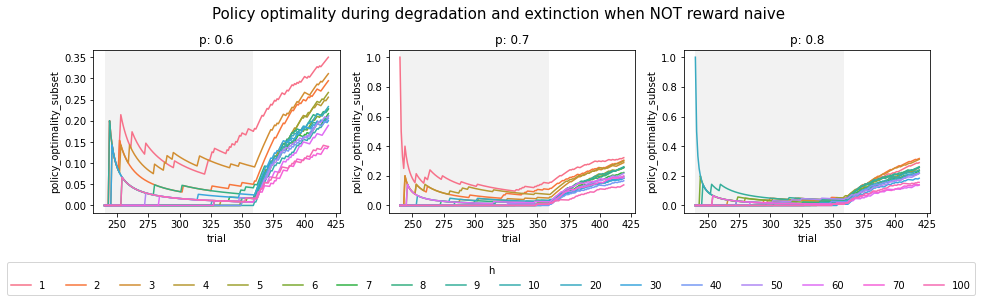

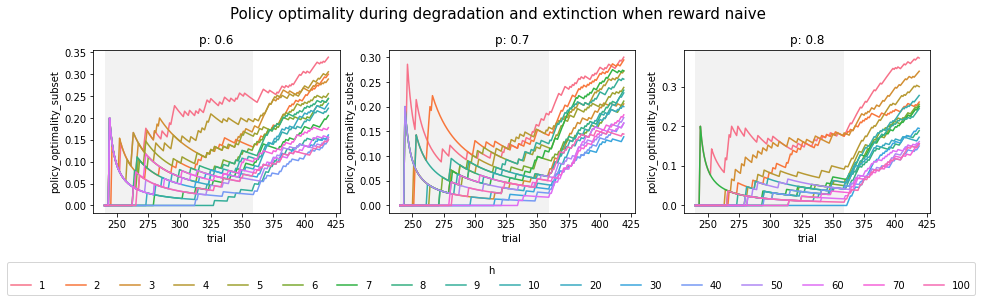

In [98]:
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

plot_df = base_df.query('trial_type > 0 & trial_type <= 2 &t==0')
plot_df = plot_df.astype({'h': 'category'})
print(plot_df.size)
plot_df['policy_optimality_subset'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
                                           (plot_df['trial'] - np.min(plot_df['trial'])+1)   


lgnd = [False, False, True]
reward_naive = [0,1]
# this is a bit confusing
ttls = ['Policy optimality during degradation and extinction when NOT reward naive',\
        'Policy optimality during degradation and extinction when reward naive']

for f in range(2):
    fig, axes = plt.subplots(ncols=3, nrows=1, figsize = (15,3))
    for p, ax in enumerate(axes.flatten()):
        sns.lineplot(ax=ax, data=plot_df.query('learn_rew==' + str(reward_naive[f]) + ' & p=='+str(ps[p])),\
                     x = 'trial',y='policy_optimality_subset', hue='h',legend=lgnd[p])
        ax.set_title('p: ' + str(ps[p]))
        ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
        cols = [[1,1,1], [0,0,0],[1,1,1]] 
        for i, row in ranges.iterrows():
            ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    ax.legend(bbox_to_anchor=(-2.75,-0.3), loc='upper left', borderaxespad=0,title='h',ncol=np.unique(plot_df['h'].size))
    fig.suptitle(ttls[f], fontsize=15, y=1.08)





### With Extinction

#### Load Data

In [115]:
# Create list of file names for some parameters
nc = 4
extinguish = True
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)


files to load: 1224


/tmp/ipykernel_7199/748232429.py:113: RuntimeWarning:

invalid value encountered in true_divide



#### Reward Known Figures

##### p=0.6

extinction: [1]
reward_naive:  False


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


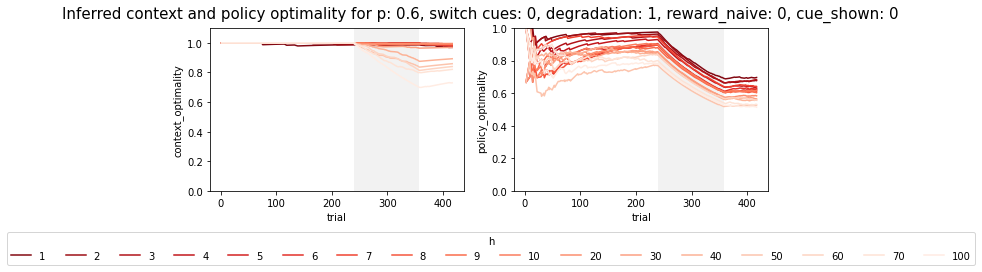

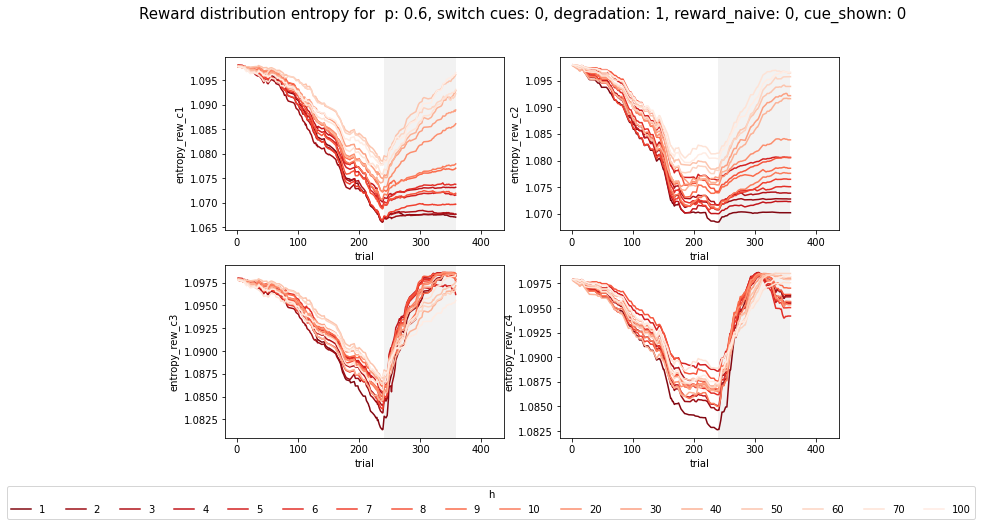

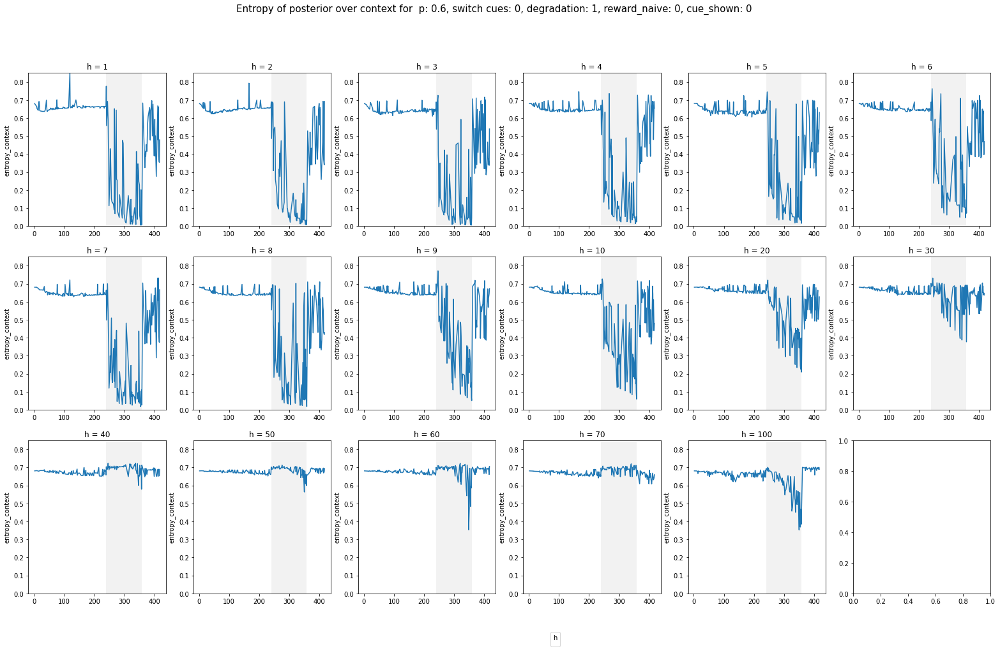

In [116]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
print('reward_naive: ', reward_naive)

context_plots('p == 0.6', plot_context_entropy=True)

Goal oriented agents do not infer context switch during degradation blocks <strong>when reward contingencies are previously known </strong>. (Fig 1). This can be seen in the fact that the entropy over reward distribution for a given context (with state averaged out) evolves in a very similar manner during the degradation trials for h>~30 agents, indicating high uncertainty over context. One can see this when plotting the entropy over contexts for the individual agents as well I think. 

##### p=0.8

extinction: [1]
reward_naive:  False


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


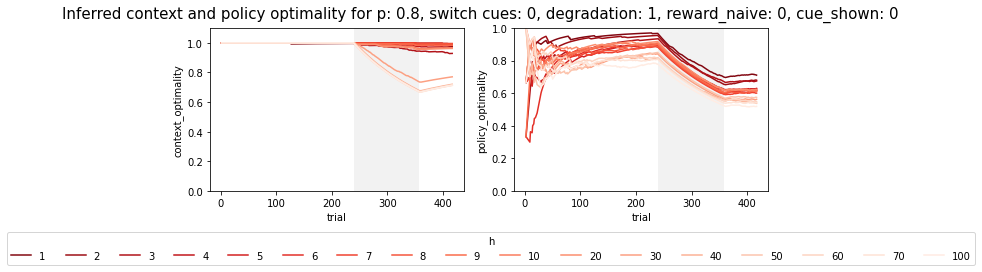

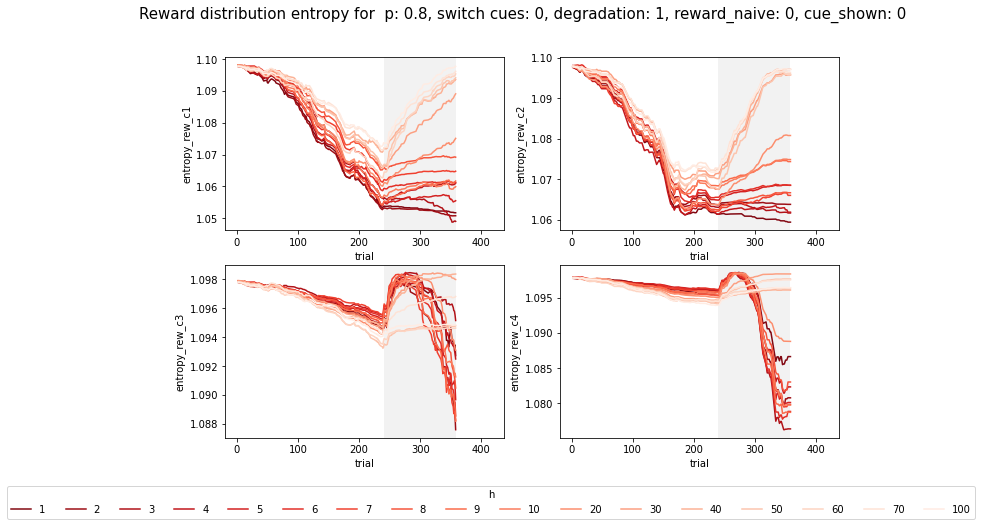

In [117]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
print('reward_naive: ', reward_naive)
context_plots('p == 0.8', plot_context_entropy=False)

The inability of the goal-oriented agents to infer context change is not alleviated by playing with the cue_ambiguity parameter p.

#### Reward Unknown Figures

##### p=0.6

extinction: [1]
reward_naive:  True


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


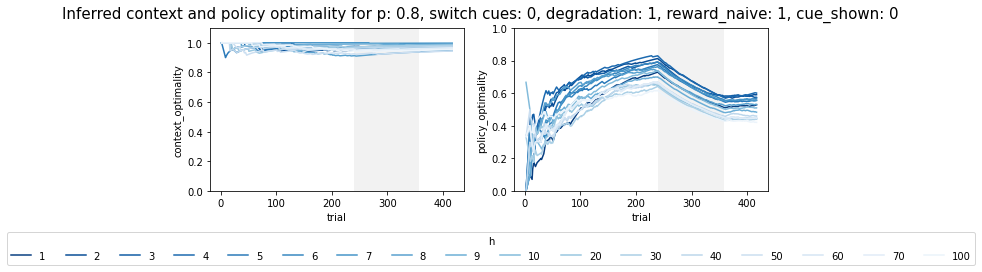

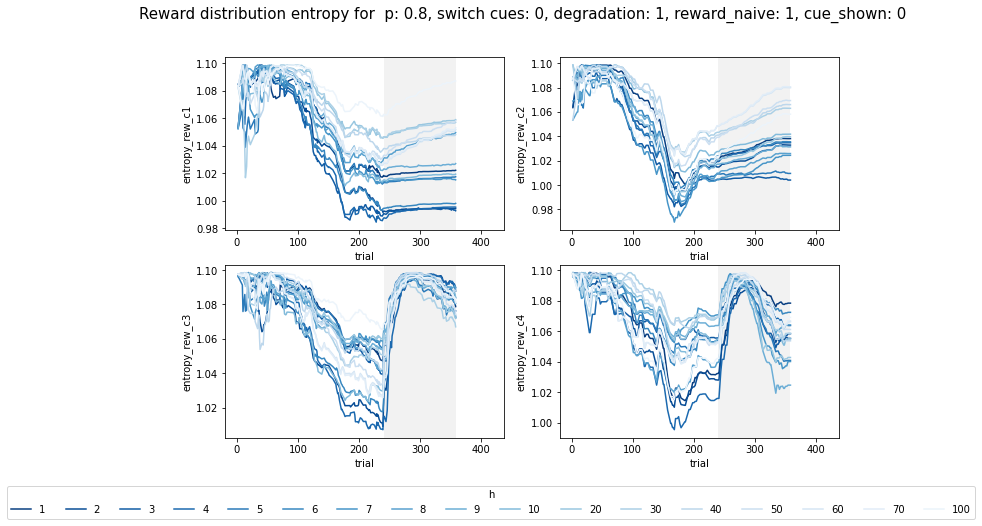

In [102]:
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
print('reward_naive: ', reward_naive)
context_plots('p == 0.8', plot_context_entropy=False)

##### p=0.8

extinction: [1]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


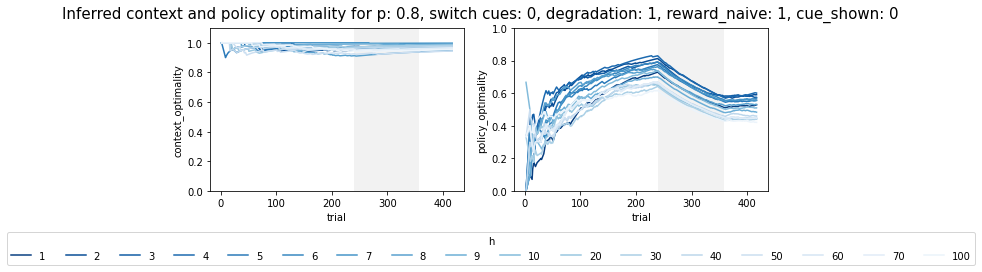

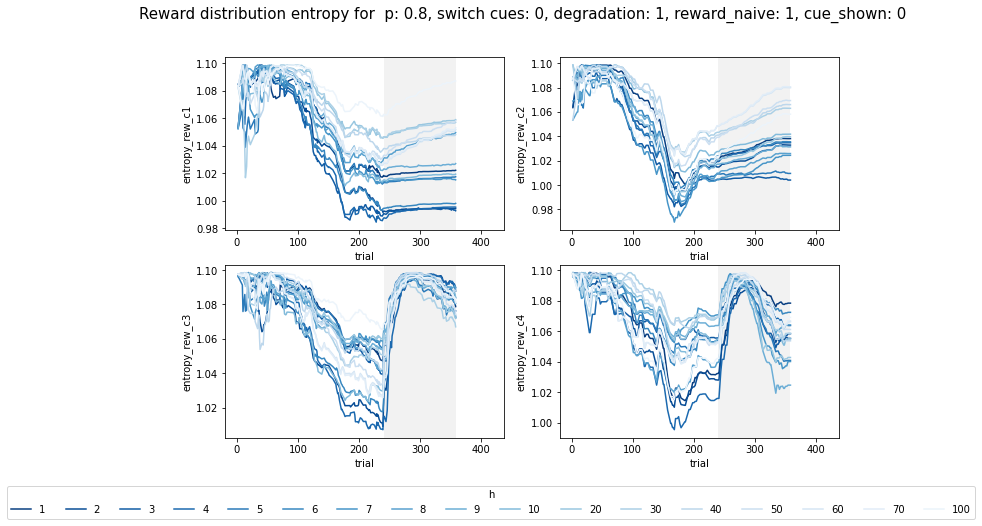

In [103]:
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8', plot_context_entropy=False)

Both habitual and goal oriented agents sucesfully infer context change when <strong> they are completely reward naive, aka the initial counts for all reward is 1</strong>

#### Policy Optimality in detail compared b/n two cases

extinction: [1]


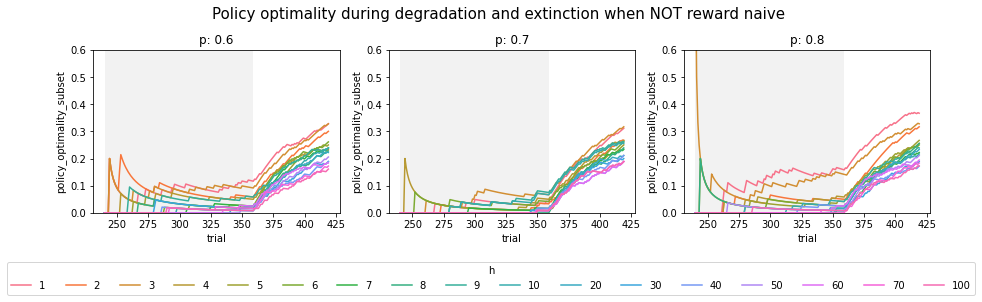

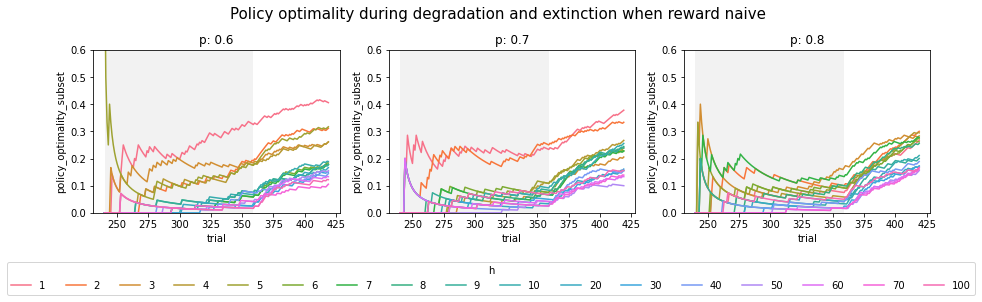

In [121]:
print('extinction:', np.unique(base_df['extinguished']))
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 2
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

plot_df = base_df.query('trial_type > 0 & trial_type <= 2 &t==0')
plot_df = plot_df.astype({'h': 'category'})
plot_df['policy_optimality_subset'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
                                           (plot_df['trial'] - np.min(plot_df['trial'])+1)   


lgnd = [False, False, True]
reward_naive = [0,1]
# this is a bit confusing
ttls = ['Policy optimality during degradation and extinction when NOT reward naive',\
        'Policy optimality during degradation and extinction when reward naive']

for f in range(2):
    fig, axes = plt.subplots(ncols=3, nrows=1, figsize = (15,3))
    for p, ax in enumerate(axes.flatten()):
        sns.lineplot(ax=ax, data=plot_df.query('learn_rew==' + str(reward_naive[f]) + ' & p=='+str(ps[p])),\
                     x = 'trial',y='policy_optimality_subset', hue='h',legend=lgnd[p])
        ax.set_title('p: ' + str(ps[p]))
        ax.set_ylim([0,0.6])
        ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
        cols = [[1,1,1], [0,0,0],[1,1,1]] 
        for i, row in ranges.iterrows():
            ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    ax.legend(bbox_to_anchor=(-2.75,-0.3), loc='upper left', borderaxespad=0,title='h',ncol=np.unique(plot_df['h'].size))
    fig.suptitle(ttls[f], fontsize=15, y=1.08)





When there are only 2 degradation blocks none of the agents manage to learn the new rewrad contingencies apart from maybe the highly habitual reward_naive ones. Consequently all start to perform better during the extinction phase. 

## Training = 4, Degradation = 4

In this section all the simulations plotted consist of:<br><br>
a) 4 "training blocks" where the reward contingencies are the ones with which a reward_naive=False agent is initated with<br>
b) 4 degradation blocks, where the reward contingencies are switched
c) one extinction blocks<br>
<br>
Each block has a length of 60 trials.

I sort of forgot to turn off the agent reward learning which at first which is why I have results sections for with and without extinction. With extinction means that the agent no longer updates reward distributions during the extinction block (and no reward is actually given either). Without extinction means that agent still learns rewards during the extinction phase (and rewards are distributed according to the training blocks contingencies)

### Without extinction  <a class="anchor" id="chapter2"></a>



#### Load Data  <a class="anchor" id="section_3_1"></a>

In [105]:
nc = 4
extinguish = False
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)


files to load: 1224


#### Learning Reward Figures  <a class="anchor" id="section_3_2"></a>

Context Exploration plots




Looks like an increse in certainty ob observation meaning makes the traces for different habitual tendnencies collapse into each other for ambiguos context transition beliefs (q=1/nc). This tendency is visible for q = 1/nc - 0.1 but appears at a higher p. 

##### p=0.6  <a class="anchor" id="section_3_2_1"></a>

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


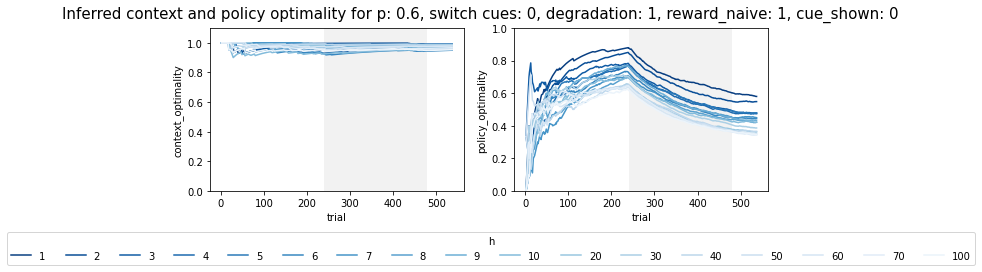

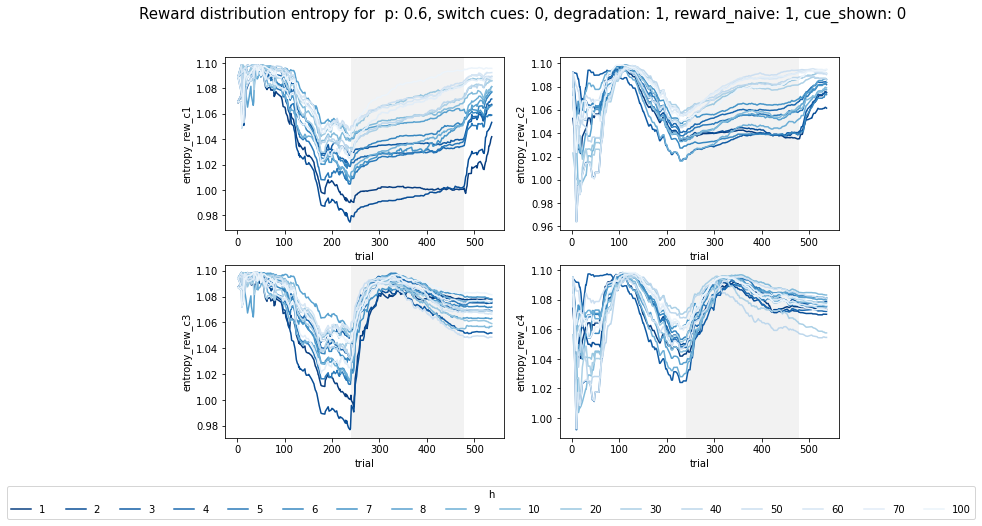

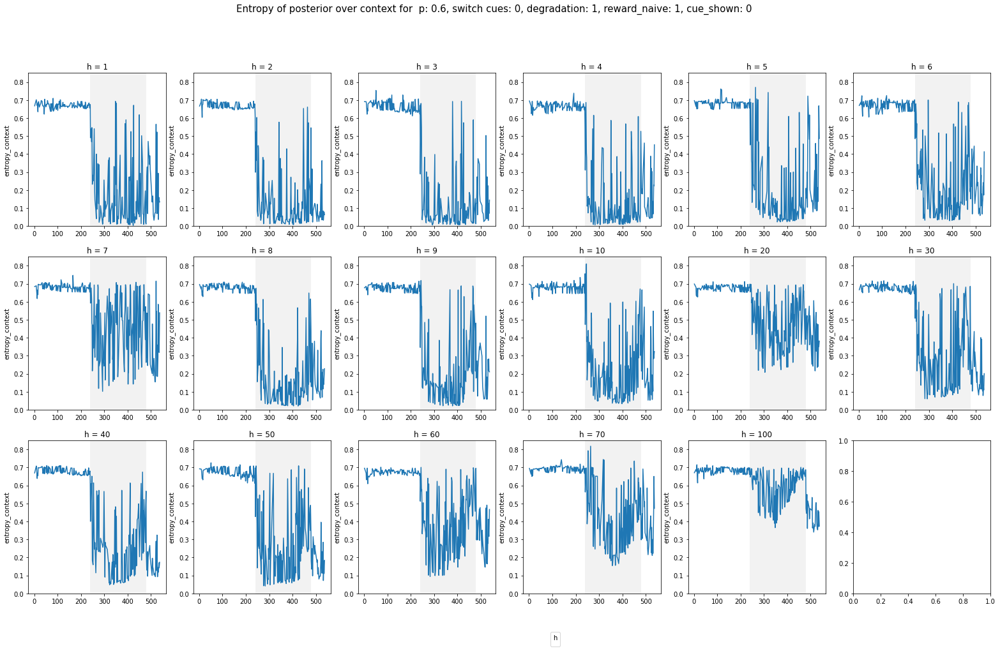

In [106]:
# context plot

# base query parameters
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
queries = ['p==0.6','p==0.7']
context_plots(queries[0])   


##### p=0.8  <a class="anchor" id="section_3_2_2"></a>

For p=0.6, agents with h>= 30 fail at inferring a context change which indicates contingency degradation (contingency degradation trials are shown in gray). This can be seen in figure 1, left panel. More habitual agents can infer a context change. 

This can also be seen in the entropy over the reward distributions and the posterior over contexts I think? For h<30 agents we have a decrease in entropy for all reward distributions, independent of context, because the posterior over contexts is still relativelly undefined. However, once the contingency degradation trials start the habitual agents infer a context change and correspondingly the reward distribution for context 3 and 4 starts to grow again because of the increased uncertainty in reward contingencies, whilst the entropy stays relatively unchanged due to the inferred context change.

For less habitual agents the reward distribution changes in a similar manner for all contexts due to the comparatively flat posterior over contexts, compared to the habitual agents. Since there are no peaks in the posterior reward contingencies are updates similarly across all contexts. 

In this graph the case of contingency degradation without cue switching was explored. Degradation trials were as many as normal trials. In graph A inferred context and policy choice is plotted. Conclusions: less habitual agents struggle to infer a context change? Need to explore if this is till the case when there is more/less context uncertainty. 

In the lower graph I have plotted the entropy over reward distribution given context with the planet variable integrated out (p(r|p,c)). As expected

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


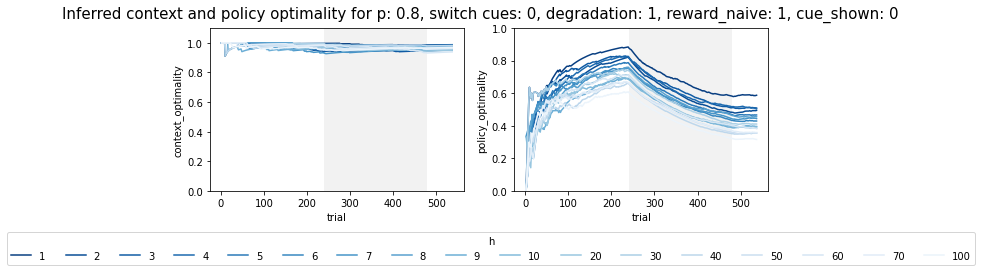

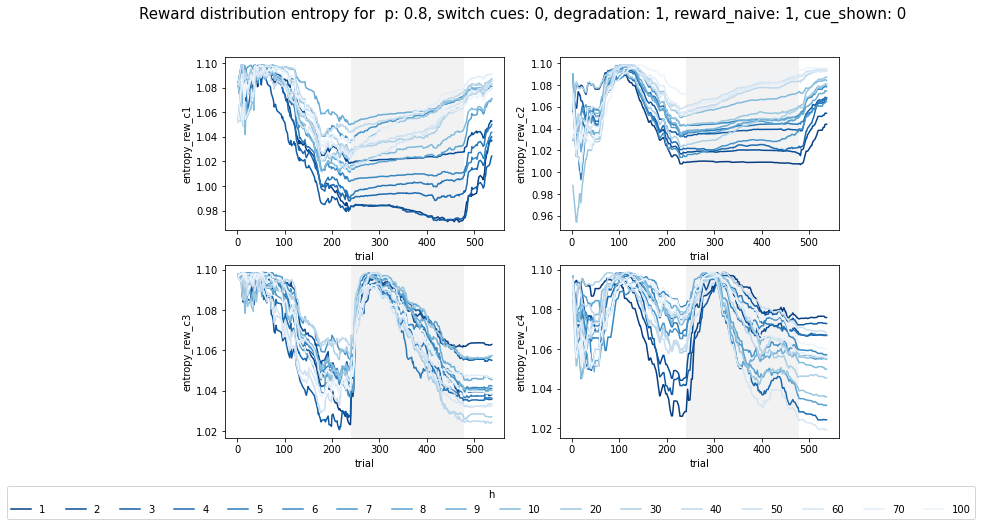

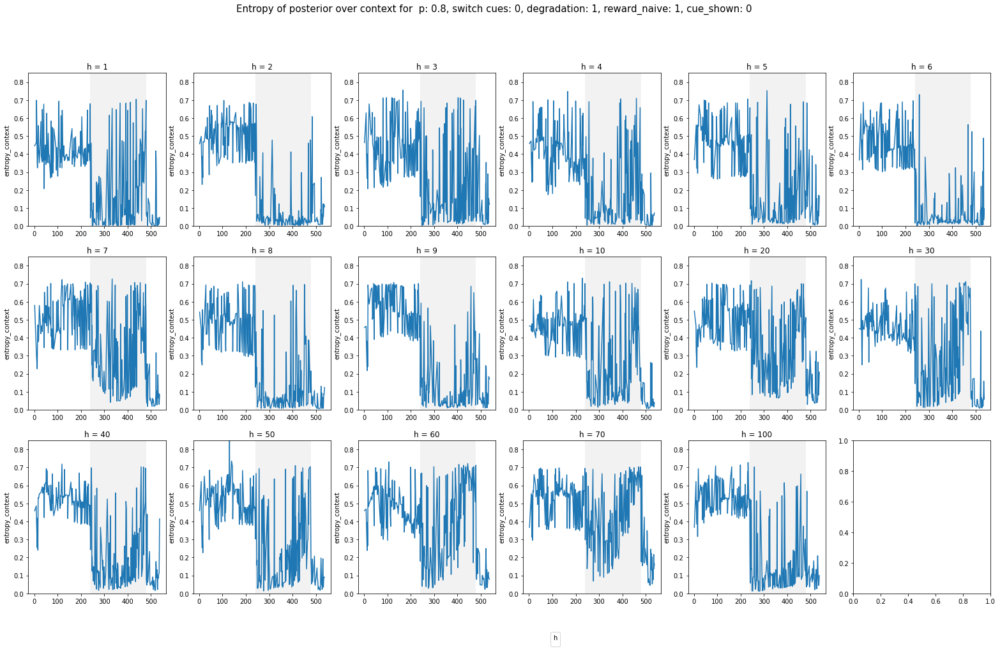

In [107]:
switch = False
contingency_degr = True
learn_r = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

context_plots('p == 0.8')

#### Reward Known figures <a class="anchor" id="section_3_3"></a>

##### p=0.6 <a class="anchor" id="section_3_3_1"></a>

extinction: [0]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


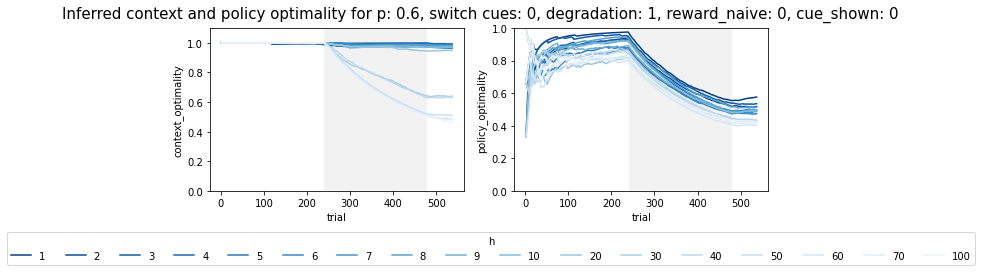

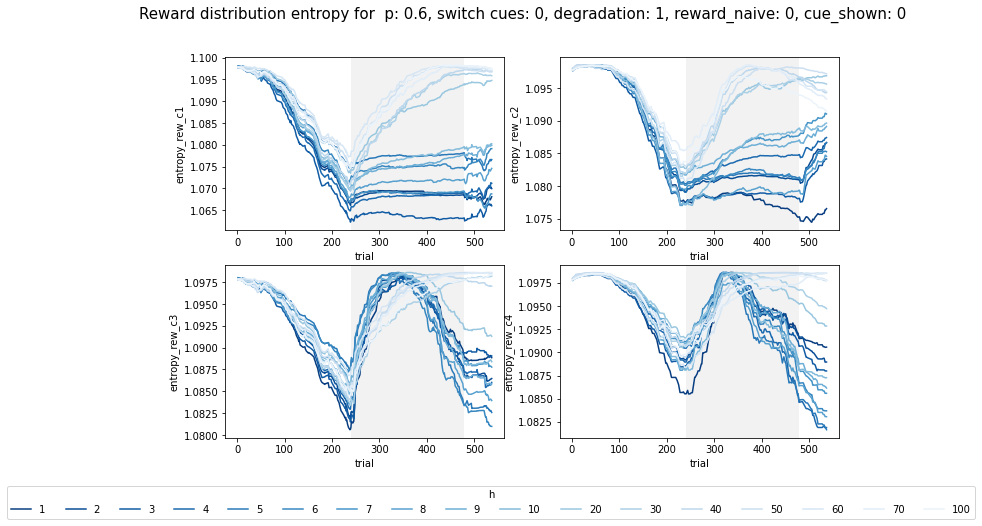

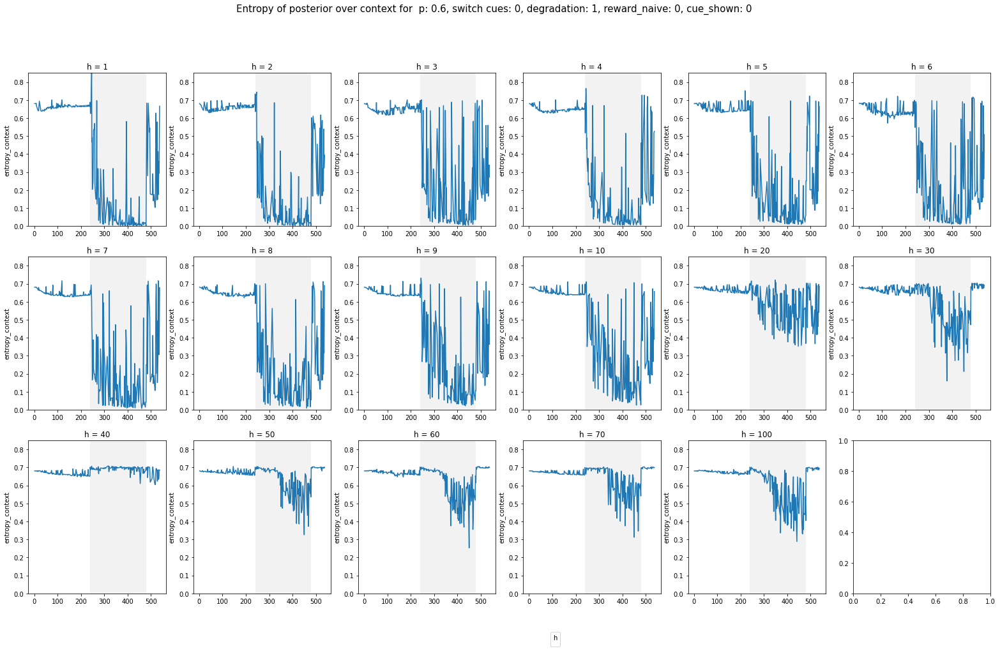

In [108]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.6')

##### p=0.8  <a class="anchor" id="section_3_3_3"></a>

extinction: [0]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


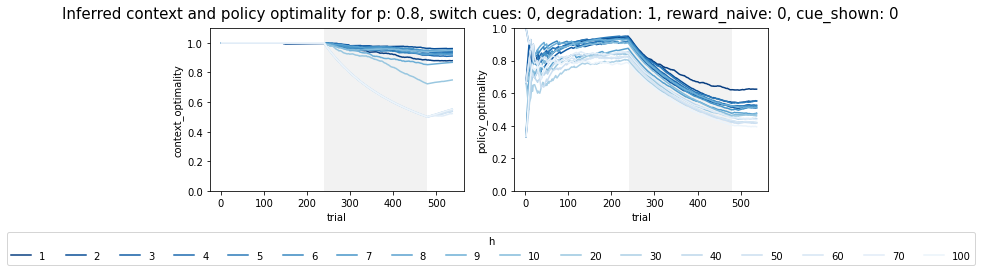

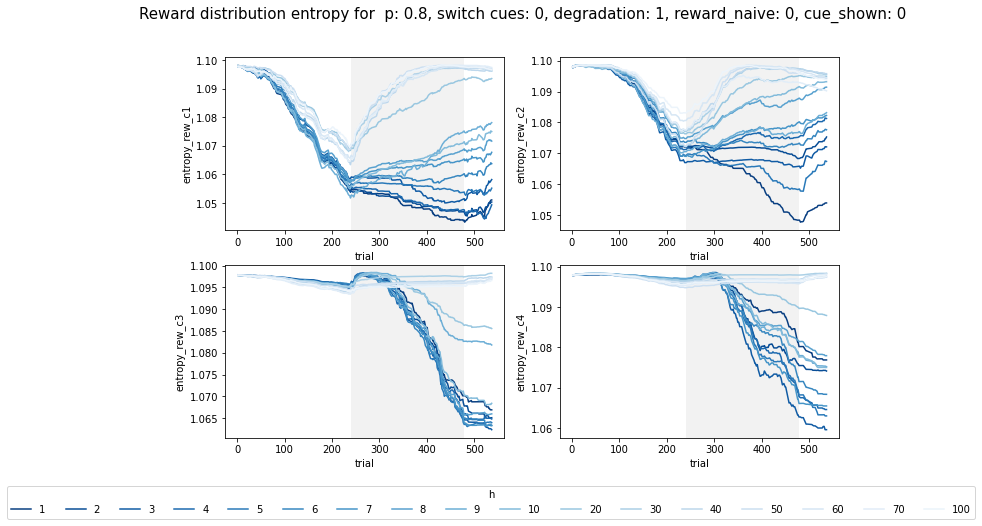

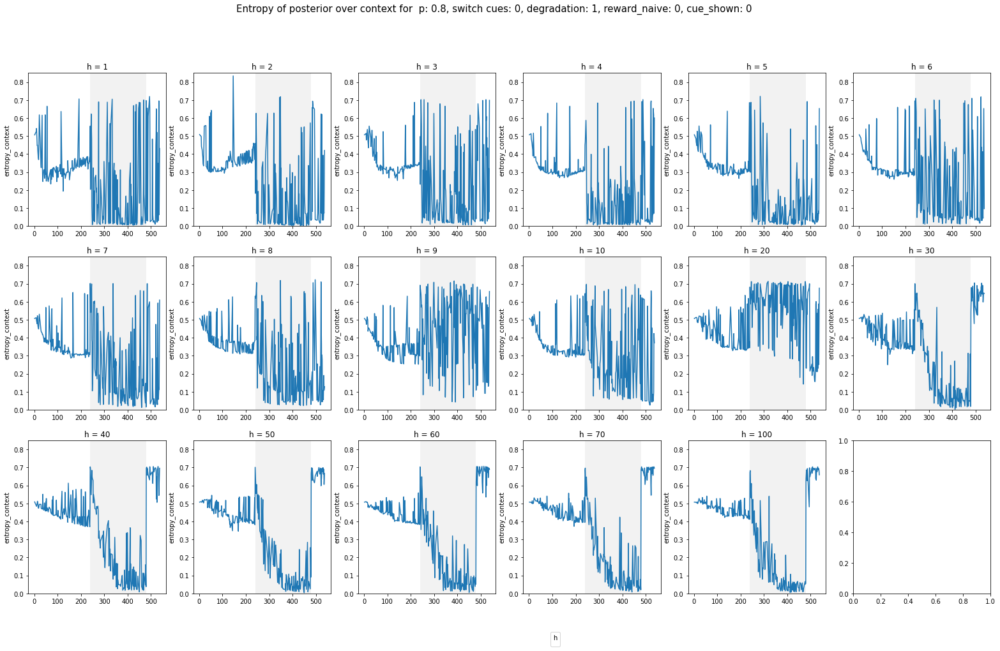

In [109]:
switch = False
contingency_degr = True
learn_r = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8')

Highly habitual agents do manage to infer a context change when they are reward naive, meaning that the initial reward counts are 1 for all rewards and all contexts. The agent above started with the correct probabilities multiplied by a 100 as initial counts which is probably too high. I should try with a midway regime of starting with the initial probabilities multipied by 2 or 5 or something so the agent is still flexible but has an idea of rewards.

NEW SIMULATION WITH EXTINCTION

In [110]:
# Create list of file names for some parameters
nc = 4
extinguish = True
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)
# df.head()

files to load: 1224


/tmp/ipykernel_7199/2540757780.py:113: RuntimeWarning:

invalid value encountered in true_divide



TypeError: int() argument must be a string, a bytes-like object or a number, not 'list'

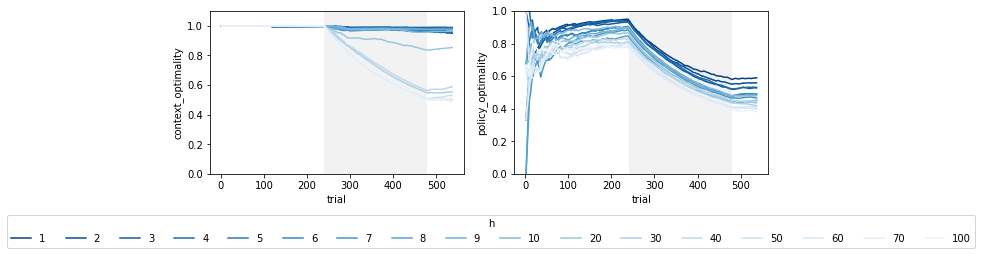

In [111]:
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
learn_r = False
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

# for col in base_df.columns:
    # print(col, np.unique(base_df[col]).size)
context_plots('p == 0.7', plot_context_entropy = False)

#### Policy Optimality in detail compared b/n two cases

In [ ]:
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

plot_df = base_df.query('trial_type > 0 & trial_type <= 2 &t==0')
plot_df = plot_df.astype({'h': 'category'})
print(plot_df.size)
plot_df['policy_optimality_subset'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
                                           (plot_df['trial'] - np.min(plot_df['trial'])+1)   


lgnd = [False, False, True]
reward_naive = [0,1]
# this is a bit confusing
ttls = ['Policy optimality during degradation and extinction when NOT reward naive',\
        'Policy optimality during degradation and extinction when reward naive']

for f in range(2):
    fig, axes = plt.subplots(ncols=3, nrows=1, figsize = (15,3))
    for p, ax in enumerate(axes.flatten()):
        sns.lineplot(ax=ax, data=plot_df.query('learn_rew==' + str(reward_naive[f]) + ' & p=='+str(ps[p])),\
                     x = 'trial',y='policy_optimality_subset', hue='h',legend=lgnd[p])
        ax.set_title('p: ' + str(ps[p]))
        ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
        cols = [[1,1,1], [0,0,0],[1,1,1]] 
        for i, row in ranges.iterrows():
            ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    ax.legend(bbox_to_anchor=(-2.75,-0.3), loc='upper left', borderaxespad=0,title='h',ncol=np.unique(plot_df['h'].size))
    fig.suptitle(ttls[f], fontsize=15, y=1.08)





### With Extinction

#### Load Data

In [ ]:
# Create list of file names for some parameters
nc = 4
extinguish = True
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)


#### Reward Known Figures

##### p=0.6

extinction: [1]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


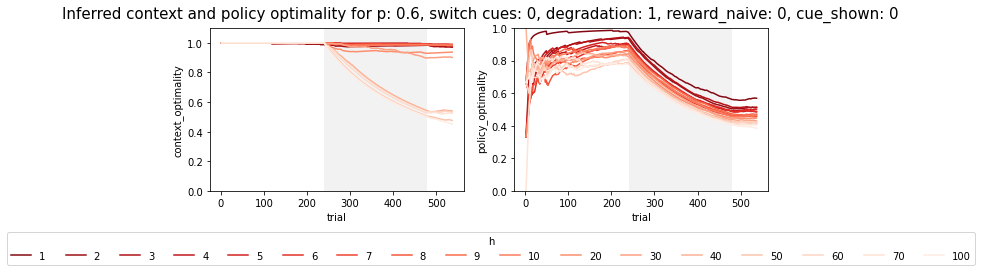

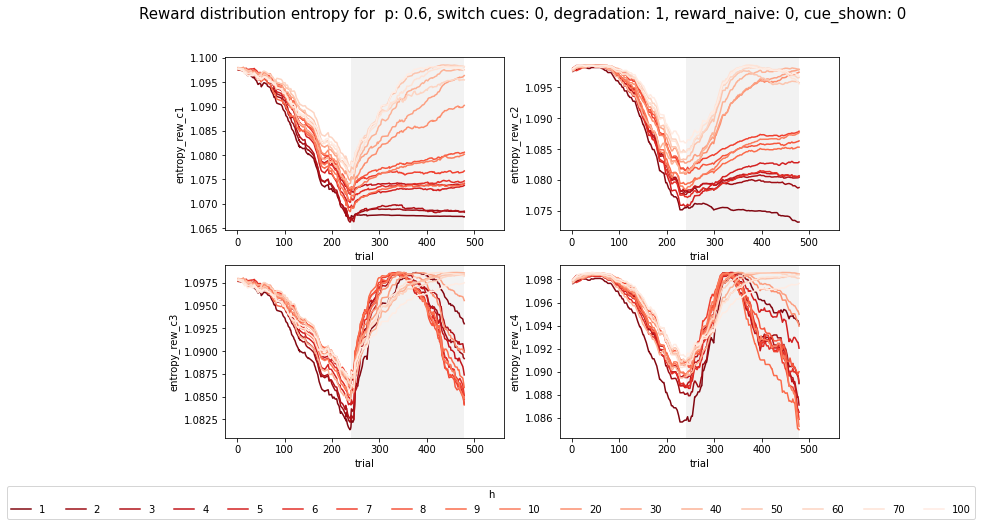

In [122]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.6', plot_context_entropy=False)

##### p=0.8

extinction: [1]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


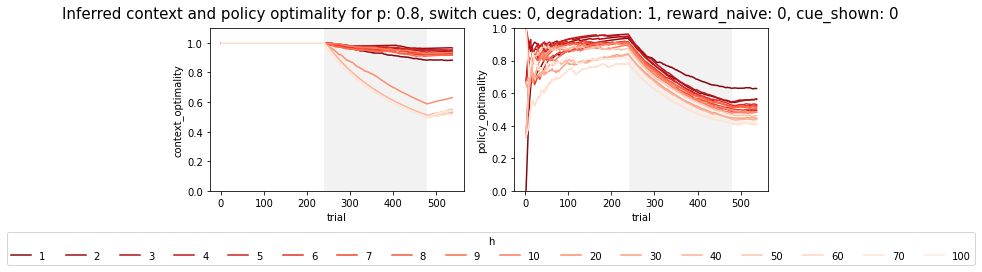

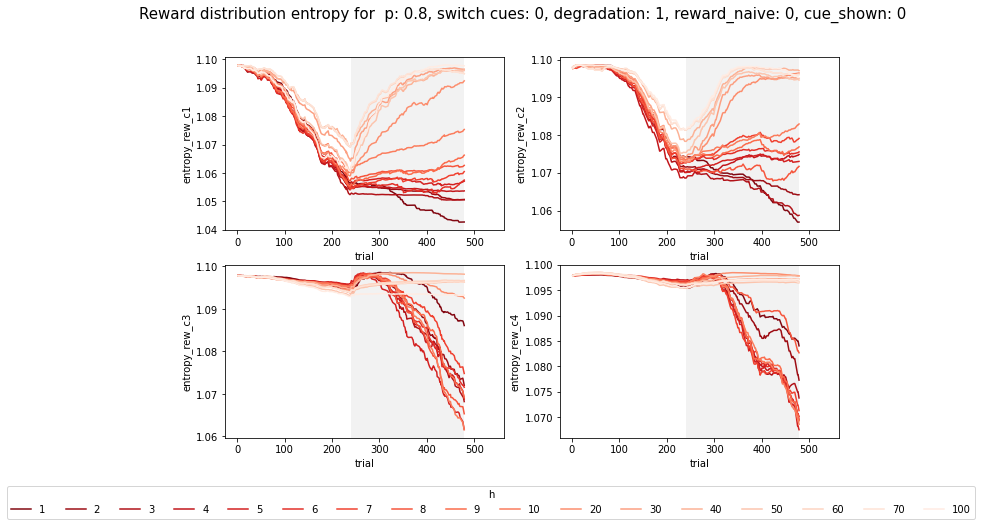

In [123]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8', plot_context_entropy=False)

#### Reward Unknown Figures

##### p=0.6

extinction: [1]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


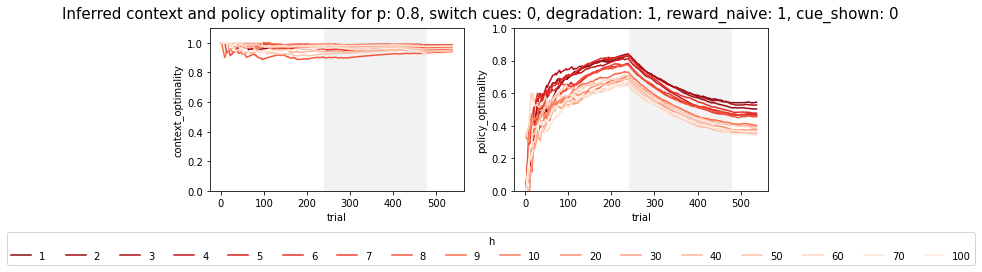

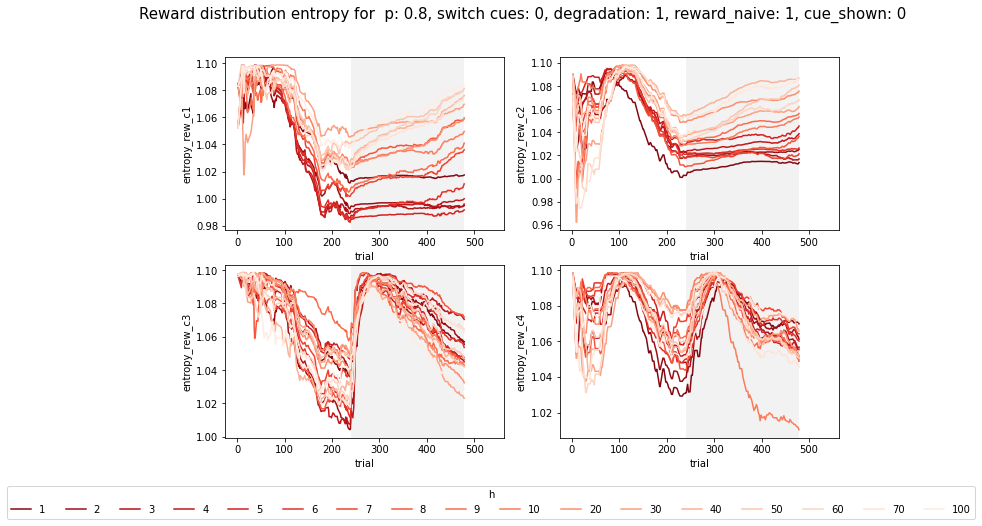

In [127]:
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8', plot_context_entropy=False)

##### p=0.8

extinction: [1]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


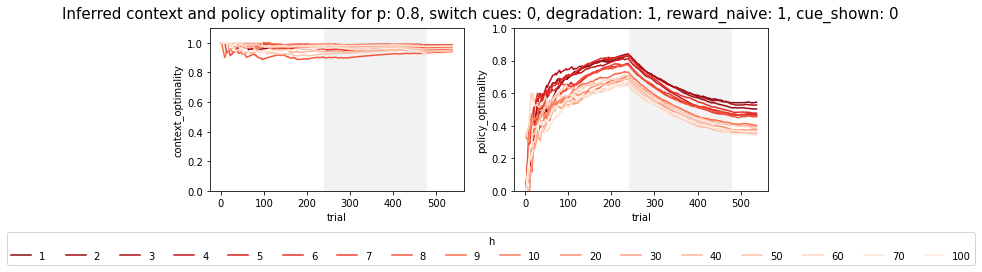

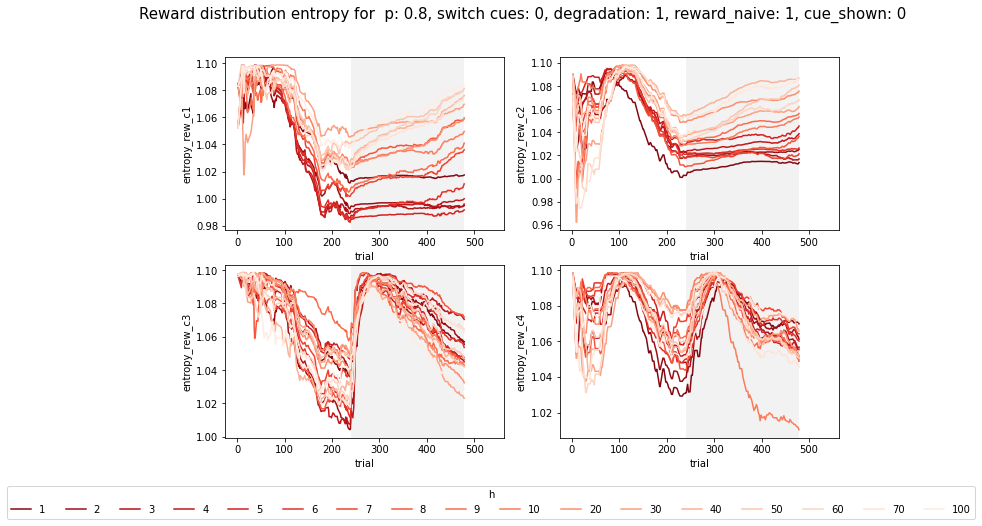

In [124]:
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8', plot_context_entropy=False)

#### Policy Optimality in detail compared b/n two cases

extinction: [1]


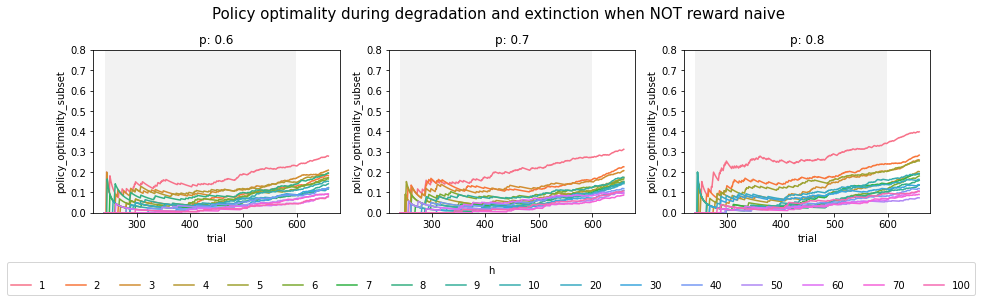

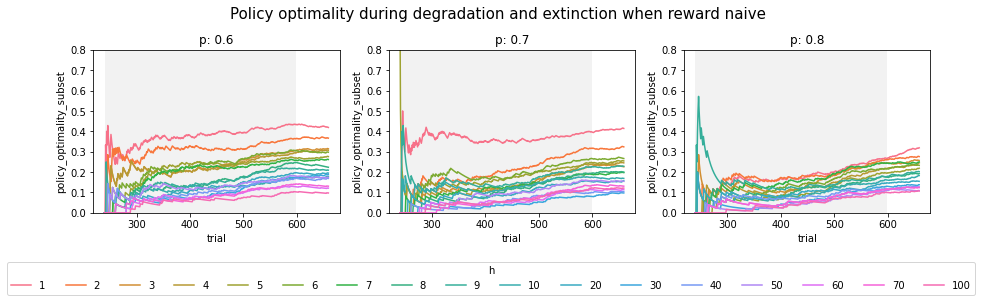

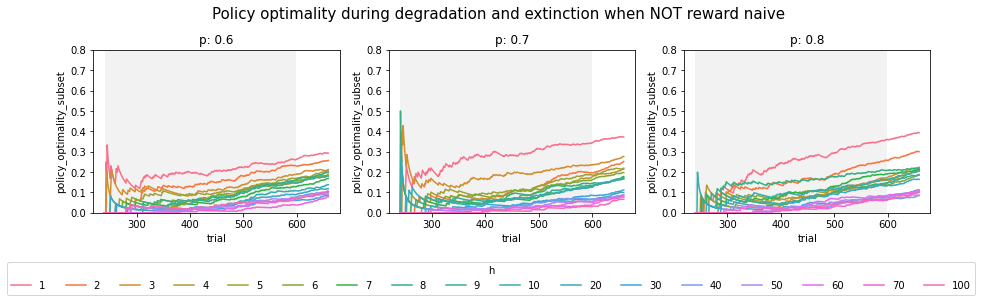

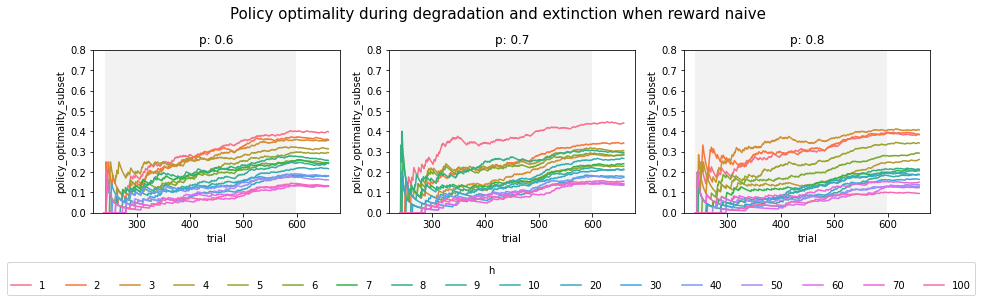

In [144]:
print('extinction:', np.unique(base_df['extinguished']))

for q in [0.25, 0.15]:
    
    ps = [0.6,0.7, 0.8]
    switch = False
    contingency_degr = True
#     q = 0.25-0.1
    h = 100
    t = 3
    trials_per_block = 60
    training_blocks = 4
    degradation_blocks = 6
    cue = 1
    strs = np.array(['switch_cues==', '& contingency_degradation==', '& q==', '& h<=',\
                     '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
    vals = np.array([switch, contingency_degr, q, h,\
                     training_blocks, degradation_blocks, trials_per_block], dtype='str')
    whole_query = np.char.join('', np.char.add(strs, vals))
    base_query = ' '.join(whole_query.tolist())
    base_df = df.query(base_query)

    plot_df = base_df.query('trial_type > 0 & trial_type <= 2 &t==0')
    plot_df = plot_df.astype({'h': 'category'})
    plot_df['policy_optimality_subset'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
                                               (plot_df['trial'] - np.min(plot_df['trial'])+1)   


    lgnd = [False, False, True]
    reward_naive = [0,1]
    # this is a bit confusing
    ttls = ['Policy optimality during degradation and extinction when NOT reward naive',\
            'Policy optimality during degradation and extinction when reward naive']

    for f in range(2):
        fig, axes = plt.subplots(ncols=3, nrows=1, figsize = (15,3))
        for p, ax in enumerate(axes.flatten()):
            sns.lineplot(ax=ax, data=plot_df.query('learn_rew==' + str(reward_naive[f]) + ' & p=='+str(ps[p])),\
                         x = 'trial',y='policy_optimality_subset', hue='h',legend=lgnd[p])
            ax.set_title('p: ' + str(ps[p]))
            ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
            cols = [[1,1,1], [0,0,0],[1,1,1]] 
            for i, row in ranges.iterrows():
                ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)
            ax.set_ylim([0,0.8])
        ax.legend(bbox_to_anchor=(-2.75,-0.3), loc='upper left', borderaxespad=0,title='h',ncol=np.unique(plot_df['h'].size))
        fig.suptitle(ttls[f], fontsize=15, y=1.08)





In terms of context inference there is nothing new to when one has 4 degradation blocks. In terms of policy optimality however, there is some differences present. First of all, policy optimality starts to increase in the latter part of the degradation block both for reward naive and non-rewrad naive agents. There is however not much difference in behvaiour between trong and weak and habit learners.

For the rewrad naive agents where context ambiguity (p) is 0.7 and 0.8 there is someting that sort of looks like differentiation where strong habit learners perform better than weak habit learners in the extinction phase which is what we ultimately want to see.

## Training = 4, Degradation = 6

### Without extinction  <a class="anchor" id="chapter2"></a>



#### Load Data  <a class="anchor" id="section_3_1"></a>

In [ ]:
nc = 4
extinguish = False
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)


#### Learning Reward Figures  <a class="anchor" id="section_3_2"></a>

Context Exploration plots




Looks like an increse in certainty ob observation meaning makes the traces for different habitual tendnencies collapse into each other for ambiguos context transition beliefs (q=1/nc). This tendency is visible for q = 1/nc - 0.1 but appears at a higher p. 

##### p=0.6  <a class="anchor" id="section_3_2_1"></a>

In [ ]:
# context plot

# base query parameters
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
queries = ['p==0.6','p==0.7']
print('extinction:', np.unique(base_df['extinguished']))
context_plots(queries[0])   


##### p=0.8  <a class="anchor" id="section_3_2_2"></a>

For p=0.6, agents with h>= 30 fail at inferring a context change which indicates contingency degradation (contingency degradation trials are shown in gray). This can be seen in figure 1, left panel. More habitual agents can infer a context change. 

This can also be seen in the entropy over the reward distributions and the posterior over contexts I think? For h<30 agents we have a decrease in entropy for all reward distributions, independent of context, because the posterior over contexts is still relativelly undefined. However, once the contingency degradation trials start the habitual agents infer a context change and correspondingly the reward distribution for context 3 and 4 starts to grow again because of the increased uncertainty in reward contingencies, whilst the entropy stays relatively unchanged due to the inferred context change.

For less habitual agents the reward distribution changes in a similar manner for all contexts due to the comparatively flat posterior over contexts, compared to the habitual agents. Since there are no peaks in the posterior reward contingencies are updates similarly across all contexts. 

In this graph the case of contingency degradation without cue switching was explored. Degradation trials were as many as normal trials. In graph A inferred context and policy choice is plotted. Conclusions: less habitual agents struggle to infer a context change? Need to explore if this is till the case when there is more/less context uncertainty. 

In the lower graph I have plotted the entropy over reward distribution given context with the planet variable integrated out (p(r|p,c)). As expected

In [ ]:
switch = False
contingency_degr = True
learn_r = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

context_plots('p == 0.8')

#### Reward Known figures <a class="anchor" id="section_3_3"></a>

##### p=0.6 <a class="anchor" id="section_3_3_1"></a>

In [ ]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.6')

##### p=0.8  <a class="anchor" id="section_3_3_3"></a>

In [ ]:
switch = False
contingency_degr = True
learn_r = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8')

Highly habitual agents do manage to infer a context change when they are reward naive, meaning that the initial reward counts are 1 for all rewards and all contexts. The agent above started with the correct probabilities multiplied by a 100 as initial counts which is probably too high. I should try with a midway regime of starting with the initial probabilities multipied by 2 or 5 or something so the agent is still flexible but has an idea of rewards.

NEW SIMULATION WITH EXTINCTION

In [ ]:
# Create list of file names for some parameters
nc = 4
extinguish = True
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)
# df.head()

In [ ]:
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
learn_r = False
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

# for col in base_df.columns:
    # print(col, np.unique(base_df[col]).size)
context_plots('p == 0.7', plot_context_entropy = False)

In [ ]:
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

plot_df = base_df.query('trial_type > 0 & trial_type <= 2 &t==0')
plot_df = plot_df.astype({'h': 'category'})
print(plot_df.size)
plot_df['policy_optimality_subset'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
                                           (plot_df['trial'] - np.min(plot_df['trial'])+1)   


lgnd = [False, False, True]
learn_r = [0,1]
for f in range(2):
    fig, axes = plt.subplots(ncols=3, nrows=1, figsize = (15,3))
    for p, ax in enumerate(axes.flatten()):
        sns.lineplot(ax=ax, data=plot_df.query('learn_rew==' + str(learn_r[f]) + ' & p=='+str(ps[p])),\
                     x = 'trial',y='policy_optimality_subset', hue='h',legend=lgnd[p])
        ax.set_title('p: ' + str(ps[p]))
        ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
        cols = [[1,1,1], [0,0,0],[1,1,1]] 
        for i, row in ranges.iterrows():
            ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    ax.legend(bbox_to_anchor=(-2.75,-0.3), loc='upper left', borderaxespad=0,title='h',ncol=np.unique(plot_df['h'].size))
    # title = 'Entropy of posterior over context for  p: ' + query[-3:] + ', switch cues: ' + str(int(switch)) + ', degradation: ' + str(int(contingency_degr)) + ', reward_naive: ' + str(int(learn_r)) + \
    #          ', cue_shown: ' + str(cue)
    #     fig.suptitle(title, fontsize=15)



#### Policy Optimality in detail compared b/n two cases

In [ ]:
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

plot_df = base_df.query('trial_type > 0 & trial_type <= 2 &t==0')
plot_df = plot_df.astype({'h': 'category'})
print(plot_df.size)
plot_df['policy_optimality_subset'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
                                           (plot_df['trial'] - np.min(plot_df['trial'])+1)   


lgnd = [False, False, True]
reward_naive = [0,1]
# this is a bit confusing
ttls = ['Policy optimality during degradation and extinction when NOT reward naive',\
        'Policy optimality during degradation and extinction when reward naive']

for f in range(2):
    fig, axes = plt.subplots(ncols=3, nrows=1, figsize = (15,3))
    for p, ax in enumerate(axes.flatten()):
        sns.lineplot(ax=ax, data=plot_df.query('learn_rew==' + str(reward_naive[f]) + ' & p=='+str(ps[p])),\
                     x = 'trial',y='policy_optimality_subset', hue='h',legend=lgnd[p])
        ax.set_title('p: ' + str(ps[p]))
        ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
        cols = [[1,1,1], [0,0,0],[1,1,1]] 
        for i, row in ranges.iterrows():
            ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    ax.legend(bbox_to_anchor=(-2.75,-0.3), loc='upper left', borderaxespad=0,title='h',ncol=np.unique(plot_df['h'].size))
    fig.suptitle(ttls[f], fontsize=15, y=1.08)





### With Extinction

#### Load Data

In [ ]:
# Create list of file names for some parameters
nc = 4
extinguish = True
h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False,True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
data_folder = 'data'
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

names = load_file_names(arrays, extinguish = extinguish)
df = load_df(names, data_folder='temp',extinguish=extinguish)


#### Reward Known Figures

##### p=0.6

extinction: [1]
reward_naive:  False


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


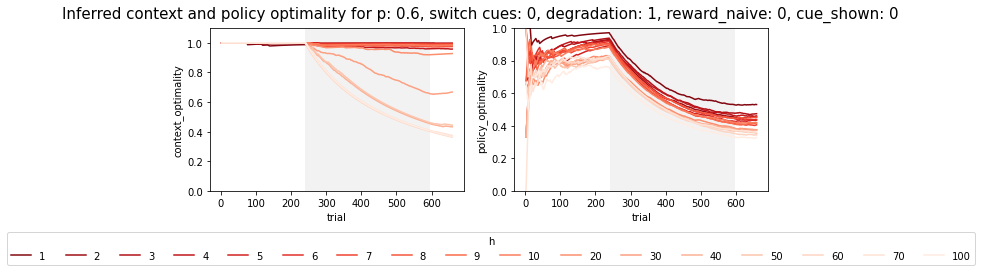

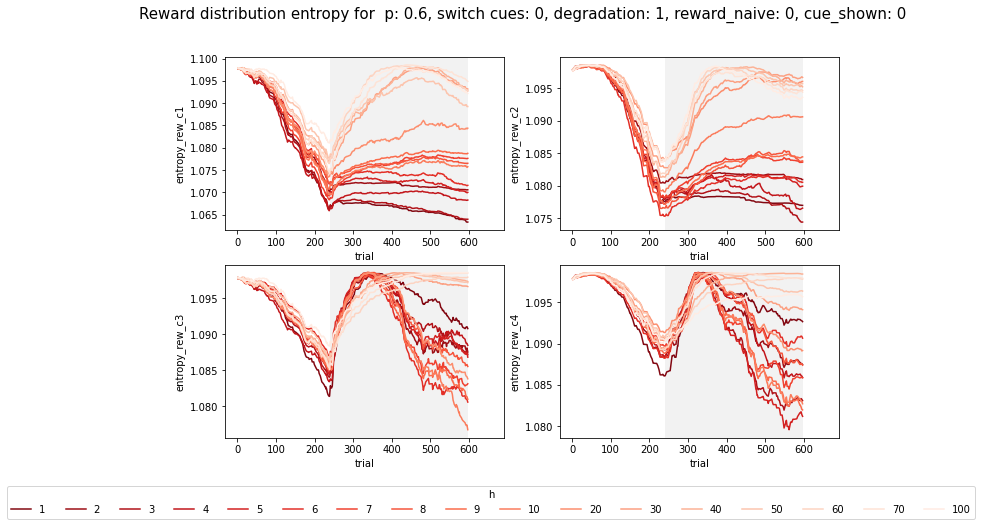

In [129]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
print('reward_naive: ', reward_naive)

context_plots('p == 0.6', plot_context_entropy=False)

##### p=0.8

extinction: [1]
reward_naive:  False


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


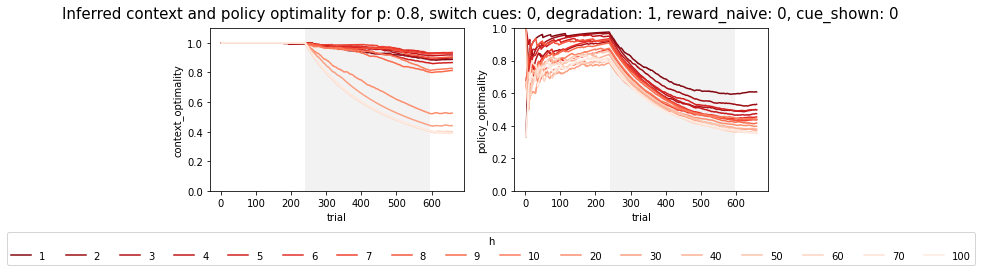

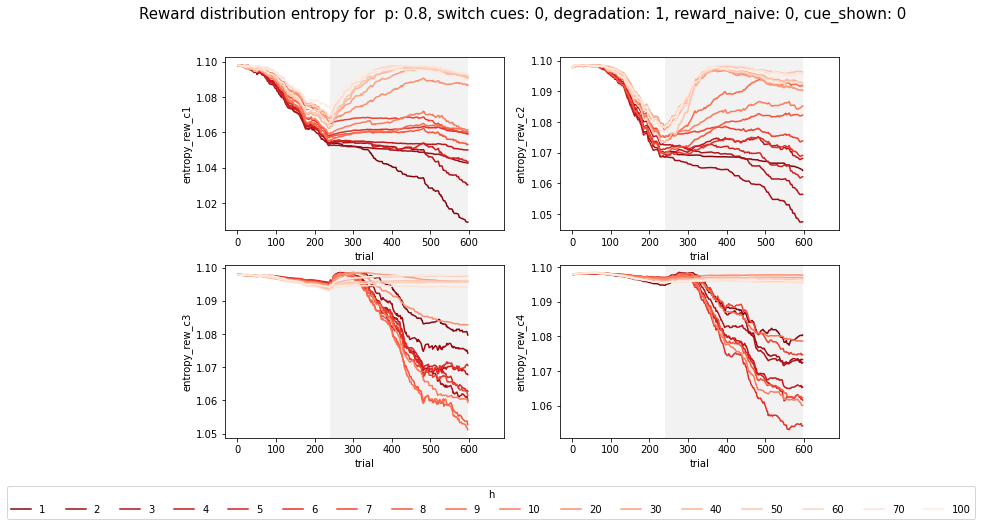

In [130]:
switch = False
contingency_degr = True
reward_naive = False
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
print('reward_naive: ', reward_naive)
context_plots('p == 0.8', plot_context_entropy=False)

#### Reward Unknown Figures

##### p=0.6

extinction: [1]
reward_naive:  True


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


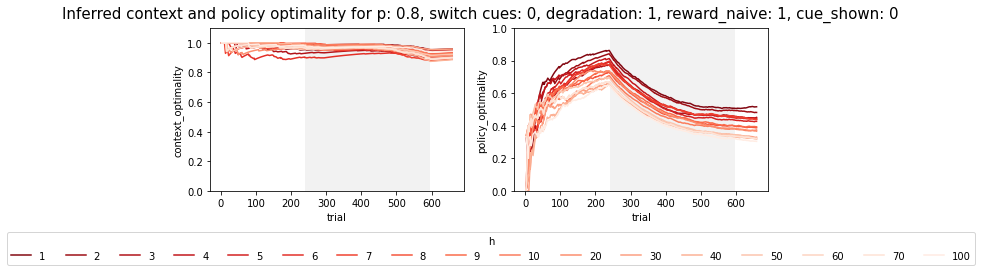

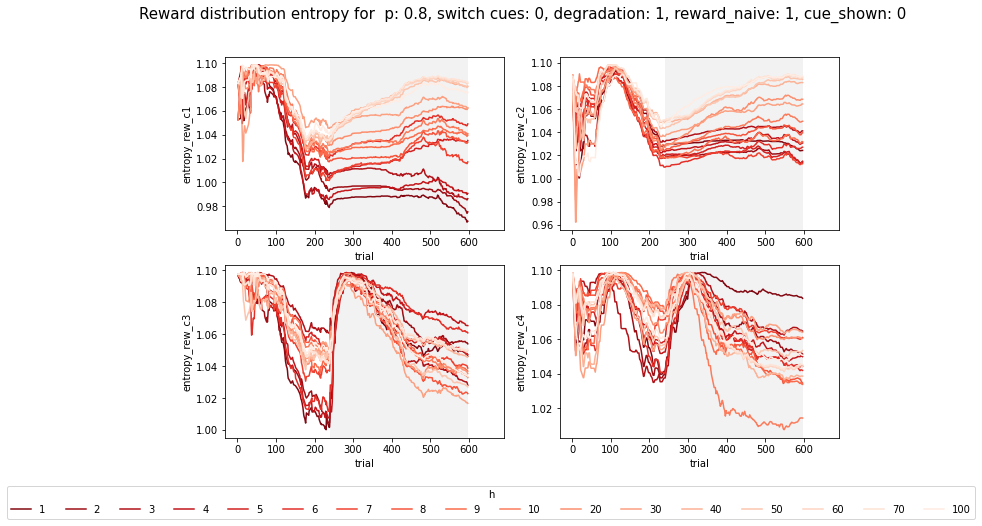

In [131]:
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
print('reward_naive: ', reward_naive)
context_plots('p == 0.8', plot_context_entropy=False)

##### p=0.8

extinction: [1]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


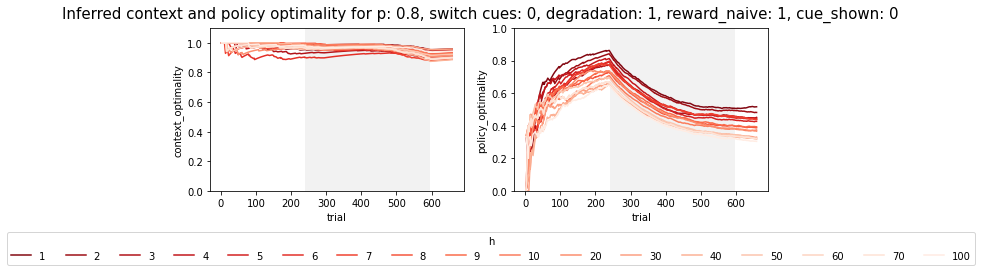

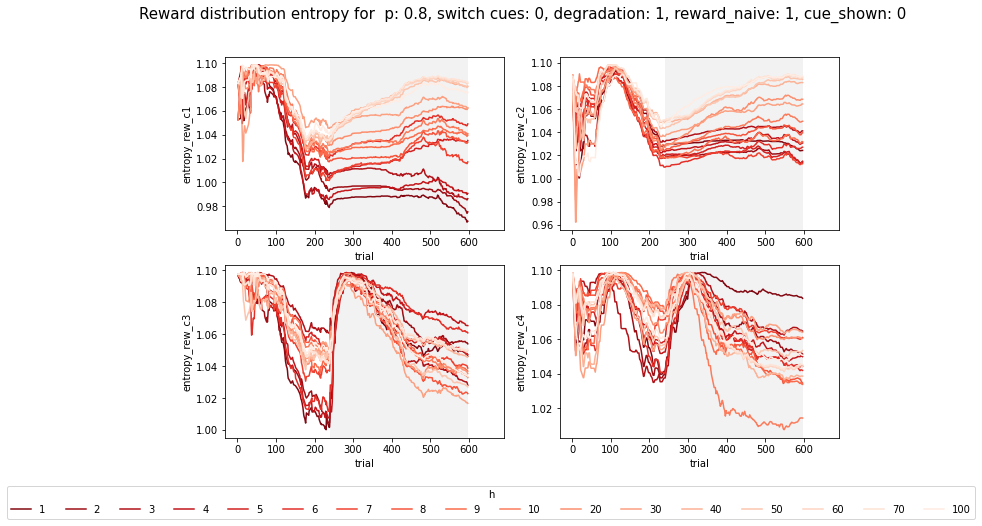

In [132]:
switch = False
contingency_degr = True
reward_naive = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, reward_naive, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)
print('extinction:', np.unique(base_df['extinguished']))
context_plots('p == 0.8', plot_context_entropy=False)

#### Policy Optimality in detail compared b/n two cases

extinction: [1]
reward_naive:  [0, 1]


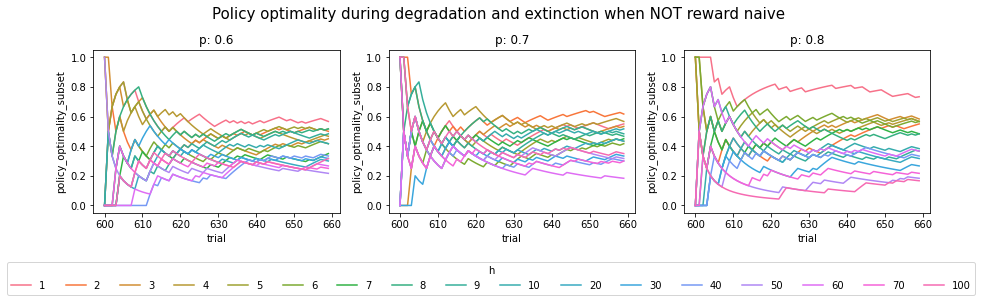

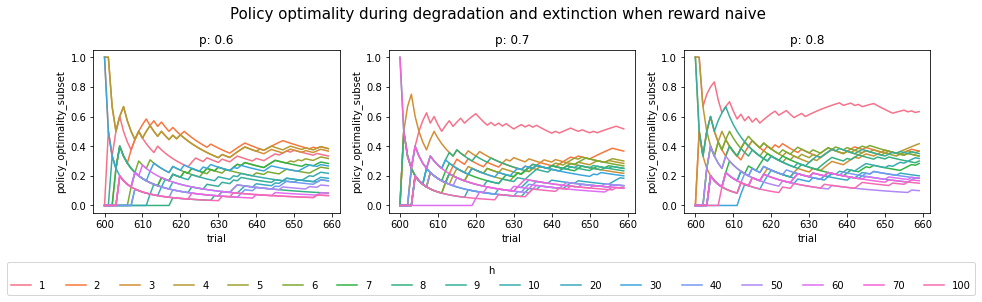

In [135]:
print('extinction:', np.unique(base_df['extinguished']))
print('reward_naive: ', reward_naive)
ps = [0.6,0.7, 0.8]
switch = False
contingency_degr = True
q = 0.25
h = 100
t = 3
trials_per_block = 60
training_blocks = 4
degradation_blocks = 6
cue = 0
strs = np.array(['switch_cues==', '& contingency_degradation==', '& q==', '& h<=',\
                 '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
vals = np.array([switch, contingency_degr, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = df.query(base_query)

plot_df = base_df.query('trial_type > 1 & trial_type <= 2 &t==0')
plot_df = plot_df.astype({'h': 'category'})
plot_df['policy_optimality_subset'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
                                           (plot_df['trial'] - np.min(plot_df['trial'])+1)   


lgnd = [False, False, True]
reward_naive = [0,1]
# this is a bit confusing
ttls = ['Policy optimality during degradation and extinction when NOT reward naive',\
        'Policy optimality during degradation and extinction when reward naive']

for f in range(2):
    fig, axes = plt.subplots(ncols=3, nrows=1, figsize = (15,3))
    for p, ax in enumerate(axes.flatten()):
        sns.lineplot(ax=ax, data=plot_df.query('learn_rew==' + str(reward_naive[f]) + ' & p=='+str(ps[p])),\
                     x = 'trial',y='policy_optimality_subset', hue='h',legend=lgnd[p])
        ax.set_title('p: ' + str(ps[p]))
        ranges = plot_df.groupby('trial_type')['trial'].agg(['min', 'max'])
        cols = [[1,1,1], [0,0,0],[1,1,1]] 
        for i, row in ranges.iterrows():
            ax.axvspan(xmin=row['min'], xmax=row['max'], facecolor=cols[i], alpha=0.05)

    ax.legend(bbox_to_anchor=(-2.75,-0.3), loc='upper left', borderaxespad=0,title='h',ncol=np.unique(plot_df['h'].size))
    fig.suptitle(ttls[f], fontsize=15, y=1.08)





## Random

### Animation scripts

#### Load animation df

In [ ]:
#df for animation 

just_simulated = False
data_folder = 'temp'

if not just_simulated:
    path = os.path.join(os.getcwd(),data_folder)
    names = os.listdir(path)

    for fi, f in enumerate(names):
        names[fi] = os.path.join(path,f)


overall_df = [None]*len(names)
for f,fname in enumerate(names):
    jsonpickle_numpy.register_handlers()

    with open(fname, 'r') as infile:
        data = json.load(infile)

    worlds = pickle.decode(data)
    meta = worlds[-1]
    nw = len(worlds[:-1])
    agents = [w.agent for w in worlds[:-1]]
    perception = [w.agent.perception for w in worlds[:-1]]
    posterior_context = [agent.posterior_context for agent in agents]
    ntrials, t, nc = posterior_context[0].shape

    taus = np.arange(ntrials)
    ts = np.arange(t)
    cs = np.arange(nc)
    mi = pd.MultiIndex.from_product([taus, ts, cs], names=['trial', 't', 'context'])
    dfs = [None]*nw
    factor = ntrials*nc*t

    for w in range(nw):
        df = pd.Series(index=mi, data=posterior_context[w].flatten())
        df = df.reset_index().rename(columns = {0:'probability'})
        df['learn_rew'] = np.repeat(meta['learn_rew'], factor)
        df['switch_cues'] = np.repeat(meta['switch_cues'], factor)
        df['contingency_degradation'] = np.repeat(meta['contingency_degradation'], factor)
        df['trials_per_block'] = np.repeat(meta['trials_per_block'], factor)
        df['degradation_blocks'] = np.repeat(meta['degradation_blocks'], factor)
        df['training_blocks'] = np.repeat(meta['training_blocks'], factor)
        df['context_cues'] = np.repeat(worlds[0].environment.context_cues, nc*t)
        df['true_optimal'] = np.repeat(meta['optimal_sequence'], nc*t)
        df['q'] = np.repeat(meta['context_trans_prob'], factor)
        df['p'] = np.repeat(meta['cue_ambiguity'], factor)
        df['h'] = np.repeat(meta['h'], factor)
        df['run'] = np.repeat(w,factor)
        df['trial_type'] = np.repeat(meta['trial_type'], nc*t)
        df['trial'] = np.repeat(np.arange(ntrials), nc*t)
        df['agent'] = np.repeat(w+f*nw,factor)
        dfs[w] = df
    
    overall_df[f] = pd.concat(dfs)

data_animation = pd.concat(overall_df)
data_animation.to_csv('data_animation.csv')


#### Plot animation

In [ ]:
# create animation
from itertools import cycle
switch = False
contingency_degr = True
learn_r = False
q = 0.25
h = 9
trials_per_block = 60
training_blocks = 4
degradation_blocks = 4
strs = np.array(['switch_cues == ', '& contingency_degradation==', '& learn_rew==', '& q==', '& h>',\
                 '& training_blocks == ', '& degradation_blocks == ', '& trials_per_block =='],dtype='str')
vals = np.array([switch, contingency_degr, learn_r, q, h,\
                 training_blocks, degradation_blocks, trials_per_block], dtype='str')
whole_query = np.char.join('', np.char.add(strs, vals))
base_query = ' '.join(whole_query.tolist())
base_df = data_animation.query(base_query)
plot_df = base_df.query('p==0.6 & context_cues == 1 & t==3')

fig = px.line(plot_df, x='context', y='probability',animation_frame='trial',animation_group='h', color="h", range_y=[0,1])

trial_type = plot_df.groupby(by=['trial'])['trial_type'].mean().to_numpy().astype('int32')

for i, frame in enumerate(fig.frames):
    frame.layout.title = "Trial type: {}".format(trial_type[i])

for step in fig.layout.sliders[0].steps:
    step["args"][1]["frame"]["redraw"] = True

fig.show()

#### 2 slider figs controlled by same slider exampel

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px

# Example Data for plot A
t = 10
npi = 8
nc = 4
data = np.zeros([npi,nc,t])
for c in range(nc):
    data[:,c,:] = np.tile(np.arange(npi).reshape(npi,1),t) +     np.random.normal(0,2,size=[npi,t])

pols = np.arange(npi)
ts = np.arange(t)
cs = np.arange(nc)

mi = pd.MultiIndex.from_product([pols, cs, ts], names=['policy', 'context', 'trial'])
df = pd.Series(index=mi, data=data.flatten())
df = df.reset_index().rename(columns = {0:'probability'})

# Desired animation for plot A
fig1 = px.line(df, x='policy', y='probability',animation_frame='trial',animation_group='context', color="context")

# Example Data for plot B
t = 10
nc = 6
tau = 4
data = np.zeros([nc,tau,t])
for ti in range(tau):
    data[:,ti,:] = np.tile(np.arange(nc).reshape(nc,1),t) + np.random.normal(0,2,size=[nc,t])

conts = np.arange(nc)
ts = np.arange(t)
taus = np.arange(tau)

mi = pd.MultiIndex.from_product([conts, taus, ts], names=['context', 'timepoint', 'trial'])
df = pd.Series(index=mi, data=data.flatten())
df = df.reset_index().rename(columns = {0:'probability'})

# Desired animation for plot B
fig2 = px.line(df, x='context', y='probability',animation_frame='trial',animation_group='timepoint', color="timepoint")

fig2


     

import plotly.graph_objects as go

# integrate the two figures, putting second figure on separate axis
fig = go.Figure(
    data=[t for t in fig1.data] + [t.update(xaxis="x2", yaxis="y2") for t in fig2.data],
    frames=[
        go.Frame(
            name=fr1.name,
            data=[t for t in fr1.data]
            + [t.update(xaxis="x2", yaxis="y2") for t in fr2.data],
        )
        for fr2, fr1 in zip(fig2.frames, fig1.frames)
    ],
    layout=fig1.layout,
)

# now config axes appropriately
fig.update_layout(
    xaxis_domain=[0, 0.49],
    xaxis2={"domain": [0.51, 1], "matches": None, "title":{"text":fig2.layout.xaxis.title.text}},
    yaxis2={"matches":"y"},
    showlegend=False,
)




### Data simulator

Currently running only on my computer but I think if you just create a folder 'temp' it should work.

In [3]:
# using a copy of run single sim because of different data pathway
from run_exampe_habit_v1 import run_agent

extinguish = True

def run_single_sim(lst,
                    ns,
                    na,
                    npl,
                    nc,
                    nr,
                    T,
                    state_transition_matrix,
                    planet_reward_probs,
                    planet_reward_probs_switched,
                    repetitions):


    switch_cues, contingency_degradation, reward_naive, context_trans_prob, cue_ambiguity, h,\
    training_blocks, degradation_blocks, trials_per_block = lst
    
    config = 'config' + '_degradation_'+ str(int(contingency_degradation)) \
                      + '_switch_' + str(int(switch_cues))                \
                      + '_train' + str(training_blocks)                   \
                      + '_degr' + str(degradation_blocks)                 \
                      + '_n' + str(trials_per_block)+'.json'

    folder = os.getcwd()

    file = open(os.path.join(folder,config))

    task_params = js.load(file)                                                                                 

    colors = np.asarray(task_params['context'])          # 0/1 as indicator of color
    sequence = np.asarray(task_params['sequence'])       # what is the optimal sequence
    starts = np.asarray(task_params['starts'])           # starting position of agent
    planets = np.asarray(task_params['planets'])         # planet positions 
    trial_type = np.asarray(task_params['trial_type'])
    blocks = np.asarray(task_params['block'])


    nblocks = int(blocks.max()+1)         # number of blocks
    trials = blocks.size                  # number of trials
    block = task_params['trials_per_block']           # trials per block
 
    meta = {
        'trial_file' : config, 
        'trial_type' : trial_type,
        'switch_cues': switch_cues == True,
        'contingency_degradation' : contingency_degradation == True,
        'learn_rew' : reward_naive == True,
        'context_trans_prob': context_trans_prob,
        'cue_ambiguity' : cue_ambiguity,
        'h' : h,
        'optimal_sequence' : sequence,
        'blocks' : blocks,
        'trials' : trials,
        'nblocks' : nblocks,
        'degradation_blocks': task_params['degradation_blocks'],
        'training_blocks': task_params['training_blocks'],
        'interlace': task_params['interlace'],
        'contingency_degrdataion': task_params['contingency_degradation'],
        'switch_cues': task_params['switch_cues'],
        'trials_per_block': task_params['trials_per_block']
    }

    all_optimal_seqs = np.unique(sequence)                                                                            

    # reward probabilities schedule dependent on trial and planet constelation
    Rho = np.zeros([trials, nr, ns])

    for i, pl in enumerate(planets):
        if i >= block*meta['training_blocks'] and i < block*(meta['training_blocks'] + meta['degradation_blocks']) and contingency_degradation:
            # print(i)
            # print(pl)
            Rho[i,:,:] = planet_reward_probs_switched[tuple([pl])].T
        else:
            Rho[i,:,:] = planet_reward_probs[tuple([pl])].T

    u = 0.99
    utility = np.array([(1-u)/2,(1-u)/2,u])

    if reward_naive==True:
        reward_counts = np.ones([nr, npl, nc])
    else:
        reward_counts = np.tile(planet_reward_probs.T[:,:,np.newaxis]*100,(1,1,nc))+1

    par_list = [h,                        
                context_trans_prob,
                cue_ambiguity,            
                'avg',                    
                Rho,                      
                utility,                  
                state_transition_matrix,  
                planets,                  
                starts,                   
                colors,
                reward_counts,
                1]

    prefix = ''
    if switch_cues == True:
        prefix += 'switch1_'
    else:
        prefix +='switch0_'

    if contingency_degradation == True:
        prefix += 'degr1_'
    else:
        prefix += 'degr0_'
    fname = prefix +'p' + str(cue_ambiguity) +'_learn_rew' + str(int(reward_naive == True)) + '_q' + str(context_trans_prob) + '_h' + str(h)+ '_' +\
    str(meta['trials_per_block']) +'_'+str(meta['training_blocks']) + str(meta['degradation_blocks'])
    
    if extinguish:
        fname +=  '_extinguish.json'
    else:
        fname += '.json'

    worlds = [run_agent(par_list, trials, T, ns , na, nr, nc, npl, trial_type=trial_type) for _ in range(repetitions)]

    worlds.append(meta)
    fname = os.path.join(os.path.join(folder,'temp'), fname)
    jsonpickle_numpy.register_handlers()
    pickled = pickle.encode(worlds)
    with open(fname, 'w') as outfile:
        json.dump(pickled, outfile)

    return fname

na = 2                                           # number of unique possible actions
nc = 4                                           # number of contexts, planning and habit
nr = 3                                           # number of rewards
ns = 6                                           # number of unique travel locations
npl = 3
steps = 3                                        # numbe of decisions made in an episode
T = steps + 1                                    # episode length


planet_reward_probs = np.array([[0.95, 0   , 0   ],
                                [0.05, 0.95, 0.05],
                                [0,    0.05, 0.95]]).T    # npl x nr
planet_reward_probs_switched = np.array([[0   , 0    , 0.95],
                                        [0.05, 0.95 , 0.05],
                                        [0.95, 0.05 , 0.0]]).T 
state_transition_matrix = np.zeros([ns,ns,na])
m = [1,2,3,4,5,0]
for r, row in enumerate(state_transition_matrix[:,:,0]):
    row[m[r]] = 1
j = np.array([5,4,5,6,2,2])-1
for r, row in enumerate(state_transition_matrix[:,:,1]):
    row[j[r]] = 1
state_transition_matrix = np.transpose(state_transition_matrix, axes= (1,0,2))
state_transition_matrix = np.repeat(state_transition_matrix[:,:,:,np.newaxis], repeats=nc, axis=3)


np.random.seed(5)

h =  [1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,100]
cue_ambiguity = [0.5, 0.6, 0.7,0.8]                       
context_trans_prob = [1/nc -0.1, 1/nc, 1/nc+0.1]                
degradation = [True]
cue_switch = [False]
reward_naive = [False, True]
training_blocks = [4]
degradation_blocks=[2,4,6]
trials_per_block=[60]
arrays = [cue_switch, degradation, reward_naive, context_trans_prob, cue_ambiguity,h,\
        training_blocks, degradation_blocks, trials_per_block]

repetitions = 1
lst = []
path = os.path.join(os.getcwd(),'temp')
existing_files = os.listdir(path)

for i in product(*arrays):
    lst.append(list(i))

last_run_simulation = 0
lst = lst[last_run_simulation:]

names = []

for li, l in enumerate(lst):
    prefix = ''
    if l[0] == True:
        prefix += 'switch1_'
    else:
        prefix +='switch0_'

    if l[1] == True:
        prefix += 'degr1_'
    else:
        prefix += 'degr0_'

    fname = prefix + 'p' + str(l[4])  +'_learn_rew' + str(int(l[2] == True))+ '_q' + str(l[3]) + '_h' + str(l[5]) + '_' +\
    str(l[8]) + '_' + str(l[6]) + str(l[7]) + '.json'
    names.append([li, fname])


missing_files = []
for name in names:
    if not name[1] in existing_files:
        missing_files.append(name[0])

lst = [lst[i] for i in missing_files]
print('simulations to run: ' + str(len(lst)))


if True:

    ca = [ns, na, npl, nc, nr, T, state_transition_matrix, planet_reward_probs,\
        planet_reward_probs_switched,repetitions]

    start =  time.perf_counter()

    with Pool() as pool:
        M = pool.starmap(run_single_sim, zip(lst,\
                                            repeat(ca[0]),\
                                            repeat(ca[1]),\
                                            repeat(ca[2]),\
                                            repeat(ca[3]),\
                                            repeat(ca[4]),\
                                            repeat(ca[5]),\
                                            repeat(ca[6]),\
                                            repeat(ca[7]),\
                                            repeat(ca[8]),\
                                            repeat(ca[9])))
    finish = time.perf_counter()
    print(f'Finished in {round(finish-start, 2)} second(s) for multithread')

simulations to run: 1224


In [ ]:
# switch = False
# contingency_degr = True
# learn_r = False
# q = 0.25
# h = 100
# t = 3
# trials_per_block = 60
# training_blocks = 4
# degradation_blocks = 4
# cue = 0
# strs = np.array(['switch_cues==', '& contingency_degradation==', '& learn_rew==', '& q==', '& h<=',\
#                  '& training_blocks==', '& degradation_blocks==', '& trials_per_block=='],dtype='str')
# vals = np.array([switch, contingency_degr, learn_r, q, h,\
#                  training_blocks, degradation_blocks, trials_per_block], dtype='str')
# whole_query = np.char.join('', np.char.add(strs, vals))
# base_query = ' '.join(whole_query.tolist())
# base_df = df.query(base_query)


# plot_df = base_df.query('trial_type == 1 & t==0')
# plot_df = plot_df.astype({'h': 'category'})

# plot_df['policy_optimality_degradation'] = plot_df.groupby(by=['agent', 'run','h'])['chose_optimal'].apply(np.cumsum) / \
#                                            (plot_df['trial'] - np.min(plot_df['trial'])+1)   

# plt.figure()
# ax = sns.lineplot(data=plot_df, x = 'trial',y='policy_optimality_degradation', hue='h')
# ax.legend(bbox_to_anchor=(1.02,1), loc='upper left', borderaxespad=0,title='h')
# ax.figure
